# Flat10 runs with FaIR v2.1.3
#### originally from: https://github.com/chrisroadmap/flat10/blob/90db2ea64377a6da45ae374e57829223576e1ac9/notebooks/flat10.ipynb#L50
#### modified by gems

In [21]:
import os
# import fair
import fair_local
from fair_local import FAIR
from fair_local.interface import fill, initialise
from fair_local.io import read_properties
import numpy as np
# import matplotlib.pyplot as pl
import matplotlib.pyplot as plt
import pandas as pd
import pooch
import seaborn as sns
from tqdm.auto import tqdm
import xarray as xr
import numpy as np
import scipy.signal
import scipy
from IPython.display import display, Math

In [22]:
from fair_local.box_model_setup import configure
PE, PS, PL, PO = configure()
pool_names = []

# print(PE['Jtmp']) # temperature anomaly (deg C)
pool_names.append('Tmp_AA (dec C)')# 0
pool_names.append('Tmp_SA (dec C)') # 1 
pool_names.append('Tmp_LL  (dec C)') # 2
pool_names.append('Tmp_NA  (dec C)') # 3
pool_names.append('Tmp_TC (dec C)') # 4 
pool_names.append('Tmp_NADW (dec C)') # 5 
pool_names.append('Tmp_AABW (dec C)') # 6 
# print(PE['Jnut']) # ocean nutrient concentration in each box (mol/m3)
pool_names.append('Nut_AA (mol/m3)') #  7
pool_names.append('Nut_SA (mol/m3)') #  8
pool_names.append('Nut_LL (mol/m3)') #  9
pool_names.append('Nut_NA (mol/m3)') #  10
pool_names.append('Nut_TC (mol/m3)') #  11
pool_names.append('Nut_NADW (mol/m3)') #  12
pool_names.append('Nut_AABW (mol/m3)') #  13
# print(PE['Jcoc']) # ocean DIC (mol/m3))
pool_names.append('DIC_AA (mol/m3)') # Antarctic surface
pool_names.append('DIC_SA (mol/m3)') # Subantarctic surface
pool_names.append('DIC_LL (mol/m3)') # Low latitude surface
pool_names.append('DIC_NA (mol/m3)') # N. Atlantic surface
pool_names.append('DIC_TC (mol/m3)') # Thermocline
pool_names.append('DIC_NADW (mol/m3)') # North Atlantic Deep Water
pool_names.append('DIC_AABW (mol/m3)') # Antarctic Bottom Water
# print(PE['Jcla']) # land carbon
pool_names.append('C_Leaf') # leaf
pool_names.append('C_Root') # root
pool_names.append('C_Wood') # wood
pool_names.append('C_Lit1') # metabolic litter
pool_names.append('C_Lit2') # structural litter
pool_names.append('C_CWDC') # coarse woody debris
pool_names.append('C_SOM1') # soil organic matter 1
pool_names.append('C_SOM2') # soil organic matter 2
pool_names.append('C_SOM3') # soil organic matter 3
# print(PE['Jatm'])
pool_names.append('C_atm') # atmos carbon

# Convert the list to an array if needed
pool_names = np.array(pool_names)

print(pool_names)

['Tmp_AA (dec C)' 'Tmp_SA (dec C)' 'Tmp_LL  (dec C)' 'Tmp_NA  (dec C)'
 'Tmp_TC (dec C)' 'Tmp_NADW (dec C)' 'Tmp_AABW (dec C)' 'Nut_AA (mol/m3)'
 'Nut_SA (mol/m3)' 'Nut_LL (mol/m3)' 'Nut_NA (mol/m3)' 'Nut_TC (mol/m3)'
 'Nut_NADW (mol/m3)' 'Nut_AABW (mol/m3)' 'DIC_AA (mol/m3)'
 'DIC_SA (mol/m3)' 'DIC_LL (mol/m3)' 'DIC_NA (mol/m3)' 'DIC_TC (mol/m3)'
 'DIC_NADW (mol/m3)' 'DIC_AABW (mol/m3)' 'C_Leaf' 'C_Root' 'C_Wood'
 'C_Lit1' 'C_Lit2' 'C_CWDC' 'C_SOM1' 'C_SOM2' 'C_SOM3' 'C_atm']


/home/disk/eos15/gshum/fair_carbon/src/fair_local/box_model_setup.py:403: RuntimeWarning: divide by zero encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/home/disk/eos15/gshum/fair_carbon/src/fair_local/box_model_setup.py:403: RuntimeWarning: invalid value encountered in divide
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));
/home/disk/eos15/gshum/fair_carbon/src/fair_local/box_model_setup.py:403: RuntimeWarning: invalid value encountered in sin
  PS['RFint'] = PS['RFamp'] * (np.sin(((PS['Yint'] - ypert)* 2 * np.pi / (PS['RFper']))));


In [23]:
# FAIR?

In [24]:
fair_local.__version__

'2.1.3'

In [25]:
# f = FAIR(n_gasboxes=31, co2_method = 'swann2010',) # n_layers=2
f = FAIR(n_gasboxes=4)
f.define_time(0, 320, 1)
# f.define_time(0, 500, 1)

In [26]:
print(f'co2_method = {f.co2_method}, n_layers = {f._n_layers}')

co2_method = default, n_layers = 3


In [27]:
# scenarios = ['esm-flat10', 'esm-flat10_zec', 'esm-flat10_cdr']
scenarios = ['esm-flat10_zec']
# scenarios = ['hist_gcb']
f.define_scenarios(scenarios)

In [28]:
cal_1_2_0_file = pooch.retrieve(
    url = "https://zenodo.org/records/8399112/files/calibrated_constrained_parameters.csv",
    known_hash = "md5:de3b83432b9d071efdd1427ad31e9076"
)

In [29]:
# how many ensemble members?
n = 200

cal_1_2_0_df = pd.read_csv(cal_1_2_0_file, index_col=0)
cal_1_2_0_df = cal_1_2_0_df[0:n]

In [10]:
# f.define_configs(list(cal_1_2_0_df.index))

In [12]:
# define SD parameters:

# Load the saved array
# arr_loaded = np.load('fair_local/defaults/data/SD_gems/config_ens_1804_02262024.npy')
# print(arr_loaded)

# config_ens = arr_loaded

# set SD carbon cycle params
beta_550_bounds = [1.1, 2.1] #[1.1, 1.6] #[1,1.5]
Q10_resp_bounds = [1.5, 2.5]
kwScalar_bounds = [0.5, 2]
PsiScalar_bounds = [0.5, 1.5] #[0.5, 2]
dPsidb_bounds = [0.1, 0.5] #[0,.5]
patm0_bounds = [282, 288]

def set_SD_params(n=1, use_saved_array = False, filename = None):
    '''
    Defines parameters for SD carbon cycle
    '''
    from scipy.stats import qmc
    
    if n == 1:
        SD_params_default = np.array([1.3, # beta_550
                                      1.6, # Q10_resp
                                      1, # kwScalar
                                      1, # PsiScalar
                                      1/3,# dPsidb
                                      284.7, #patm0
                                     ])
        config_ens = SD_params_default
    elif use_saved_array == True:
        # Load the saved array
        if filename:
            file = filename
        else:
            file = 'config_ens_1804_02262024'
        arr_loaded = np.load(f'fair_local/defaults/data/SD_gems/{file}.npy')
    else:
        # Define parameter ranges using Latin Hypercube Sampler

#         sampler = qmc.LatinHypercube(d=5) # since we have 5 variables we'll need a 5d range
        sampler = qmc.LatinHypercube(d=6) # since we have 6 variables we'll need a 5d range
        sample = sampler.random(n=n) # gives you n number of samples, range of 0-1 (need to give highs and lows)

        # Compute the quality of the sample using the discrepancy criterion.
        qmc.discrepancy(sample)

#         # Define parameter ranges
#         beta_550_bounds = [1.1, 1.6] #[1,1.5]
#         Q10_resp_bounds = [1.5, 2.5]
#         kwScalar_bounds = [0.5, 2]
#         PsiScalar_bounds = [0.5, 1.5] #[0.5, 2]
#         dPsidb_bounds = [0.1, 0.5] #[0,.5]

        # Define lower and upper bounds
        l_bounds = []
        u_bounds = []
        parameter_bounds =[beta_550_bounds,
                          Q10_resp_bounds,
                          kwScalar_bounds,
                          PsiScalar_bounds,
                          dPsidb_bounds,
                          patm0_bounds]
        for bounds in parameter_bounds:
            l_bounds.append(bounds[0])
            u_bounds.append(bounds[1])

        # Scale sample to bounds:
        config_ens = qmc.scale(sample, l_bounds, u_bounds)

        # Print the number of parameter combinations
        print("Number of parameter combinations:", len(config_ens))
        
    return config_ens

config_ens = set_SD_params(n = n)

Number of parameter combinations: 200


In [13]:
# add SD parameters
gems_cal_1_2_0_df = cal_1_2_0_df.assign(gems_beta_550 = list(config_ens.transpose()[0]),
                                        gems_Q10_resp = list(config_ens.transpose()[1]),
                                        gems_kwScalar = list(config_ens.transpose()[2]),
                                        gems_PsiScalar = list(config_ens.transpose()[3]),
                                        gems_dPsidb = list(config_ens.transpose()[4]),
                                        gems_patm0 = list(config_ens.transpose()[5]),
                                                          ) 

In [171]:
# import datetime

# df = gems_cal_1_2_0_df
# file_name = f'gems_cal_1_2_0_df_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}'
# df.to_csv(f'fair_local/defaults/data/SD_gems/{file_name}.csv')

file_name = 'gems_cal_1_2_0_df_0919_03152024' #ensemble without patm0
# file_name = 'gems_cal_1_2_0_df_1919_03202024' #ensemble WITH patm0

df = pd.read_csv(f'fair_local/defaults/data/SD_gems/{file_name}.csv')
gems_cal_1_2_0_df = df

In [172]:
# # add DEFAULT SD parameters
# # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# # DONT RUN ME IF YOU DON'T WANT DEFAULT SD PARAMETERS
# # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# gems_beta_550_default = []
# gems_Q10_resp_default = []
# gems_kwScalar_default = []
# gems_PsiScalar_default = []
# gems_dPsidb_default = []
# for i in range(len(list(config_ens.transpose()[0]))):
#     gems_beta_550_default.append(1.2)
#     gems_Q10_resp_default.append(1.6)
#     gems_kwScalar_default.append(1)
#     gems_PsiScalar_default.append(1)
#     gems_dPsidb_default.append(0.3333)
# print(gems_beta_550_default)
# # add SD parameters
# gems_cal_1_2_0_df = cal_1_2_0_df.assign(gems_beta_550 = gems_beta_550_default,
#                                         gems_Q10_resp = gems_Q10_resp_default,
#                                         gems_kwScalar = gems_kwScalar_default,
#                                         gems_PsiScalar = gems_PsiScalar_default,
#                                         gems_dPsidb = gems_dPsidb_default,
#                                                           ) 

In [30]:
f.define_configs(list(cal_1_2_0_df.index))
# f.define_configs(list(gems_cal_1_2_0_df.index))

In [31]:
species = ['CO2',
           'CH4', 'N2O'
          ]
properties = {
    "CO2": {
        'type': 'co2',
        'input_mode': 'emissions',
        'greenhouse_gas': True,
        'aerosol_chemistry_from_emissions': False,
        'aerosol_chemistry_from_concentration': False
    },
    "CH4": {
        'type': 'ch4',
        'input_mode': 'emissions',
        'greenhouse_gas': True,
        'aerosol_chemistry_from_emissions': False,
        'aerosol_chemistry_from_concentration': False
    },
    "N2O": {
        'type': 'n2o',
        'input_mode': 'emissions',
        'greenhouse_gas': True,
        'aerosol_chemistry_from_emissions': False,
        'aerosol_chemistry_from_concentration': False
    }
}

In [32]:
# declare species and properties
f.define_species(species, properties)

In [33]:
f.allocate()

In [34]:
# fill emissions: zero for non-CO2
f.emissions.loc[dict(specie="CH4")] = 0
f.emissions.loc[dict(specie="N2O")] = 0

In [35]:
# constant pre-industrial concentration for non-CO2 GHGs
f.concentration.loc[dict(specie='CH4')] = 808.2490285
f.concentration.loc[dict(specie='N2O')] = 273.021047

In [179]:
gcb_hist_file = os.path.join("fair_local", "defaults", "data", "emissions", "GCB_emissions.csv")
gcb_hist  = pd.read_csv(gcb_hist_file, skiprows = 1)
gcb_hist_array = np.array(gcb_hist['TOT emit'])
np.shape(gcb_hist_array * 44.009 / 12.011)

(172,)

In [180]:
# uncomment for gcb_hist emissions
# f.emissions.loc[dict(specie="CO2", scenario="hist_gcb", timepoints=np.arange(0.5, len(gcb_hist_array)))].config

In [181]:
np.linspace(9.9, -9.9, 100)  # 100 timepoints, from years 100.5 to 199.5 inclusive

array([ 9.9,  9.7,  9.5,  9.3,  9.1,  8.9,  8.7,  8.5,  8.3,  8.1,  7.9,
        7.7,  7.5,  7.3,  7.1,  6.9,  6.7,  6.5,  6.3,  6.1,  5.9,  5.7,
        5.5,  5.3,  5.1,  4.9,  4.7,  4.5,  4.3,  4.1,  3.9,  3.7,  3.5,
        3.3,  3.1,  2.9,  2.7,  2.5,  2.3,  2.1,  1.9,  1.7,  1.5,  1.3,
        1.1,  0.9,  0.7,  0.5,  0.3,  0.1, -0.1, -0.3, -0.5, -0.7, -0.9,
       -1.1, -1.3, -1.5, -1.7, -1.9, -2.1, -2.3, -2.5, -2.7, -2.9, -3.1,
       -3.3, -3.5, -3.7, -3.9, -4.1, -4.3, -4.5, -4.7, -4.9, -5.1, -5.3,
       -5.5, -5.7, -5.9, -6.1, -6.3, -6.5, -6.7, -6.9, -7.1, -7.3, -7.5,
       -7.7, -7.9, -8.1, -8.3, -8.5, -8.7, -8.9, -9.1, -9.3, -9.5, -9.7,
       -9.9])

In [44]:
# # fill emissions of CO2 for each scenario
# # f.emissions.loc[dict(specie="CO2", scenario="esm-flat10")] = 10 * 44.009 / 12.011
f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec", timepoints=np.arange(0.5, 100))] = 10 * 44.009 / 12.011
f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec", timepoints=np.arange(100.5, 320))] = 0
# # f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(0.5, 100))] = 10 * 44.009 / 12.011
# # f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(100.5, 200))] = np.linspace(9.9, -9.9, 100)[:, None] * 44.009 / 12.011
# # f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(200.5, 300))] = -10 * 44.009 / 12.011
# # f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timepoints=np.arange(300.5, 320))] = 0
# for config in f.emissions.loc[dict(specie="CO2", scenario="hist_gcb", timepoints=np.arange(0.5, len(gcb_hist_array)))].config:
# #     f.emissions.loc[dict(specie="CO2", scenario="hist_gcb",config = config, timepoints=np.arange(0.5, 30))] = 0
#     f.emissions.loc[dict(specie="CO2", scenario="hist_gcb",config = config, timepoints=np.arange(0.5, len(gcb_hist_array)))] = gcb_hist_array * 44.009 / 12.011
#     f.emissions.loc[dict(specie="CO2", scenario="hist_gcb",config = config, timepoints=np.arange(len(gcb_hist_array)+0.5, 500))] = 0


In [183]:
GEMS_SPECIES_CONFIG_FILE = os.path.join("fair_local", "defaults", "data", "ar6", "species_configs_properties_gems.csv")
GEMS_SPECIES_CONFIG_FILE

'fair_local/defaults/data/ar6/species_configs_properties_gems.csv'

In [184]:
pd.read_csv(GEMS_SPECIES_CONFIG_FILE).gems_beta_550

0     NaN
1     NaN
2     1.3
3     NaN
4     NaN
     ... 
59    NaN
60    NaN
61    NaN
62    NaN
63    NaN
Name: gems_beta_550, Length: 64, dtype: float64

In [36]:
# Get default species configs
# f.fill_species_configs(filename = GEMS_SPECIES_CONFIG_FILE)
f.fill_species_configs()

In [37]:
PE['patm0']*1e6

284.7

In [38]:
# Climate response
fill(f.climate_configs['ocean_heat_capacity'], cal_1_2_0_df.loc[:,'clim_c1':'clim_c3'])
fill(f.climate_configs['ocean_heat_transfer'], cal_1_2_0_df.loc[:,'clim_kappa1':'clim_kappa3'])
fill(f.climate_configs['deep_ocean_efficacy'], cal_1_2_0_df.loc[:,'clim_epsilon'])
fill(f.climate_configs['gamma_autocorrelation'], cal_1_2_0_df.loc[:,'clim_gamma'])
fill(f.climate_configs['stochastic_run'], False)

# carbon cycle
fill(f.species_configs['iirf_0'], cal_1_2_0_df.loc[:, 'cc_r0'].values.squeeze(), specie='CO2')
fill(f.species_configs['iirf_airborne'], cal_1_2_0_df.loc[:, 'cc_rA'].values.squeeze(), specie='CO2')
fill(f.species_configs['iirf_uptake'], cal_1_2_0_df.loc[:, 'cc_rU'].values.squeeze(), specie='CO2')
fill(f.species_configs['iirf_temperature'], cal_1_2_0_df.loc[:, 'cc_rT'].values.squeeze(), specie='CO2')

# Scale CO2 forcing based on its 4xCO2 calibration
fill(f.species_configs["forcing_scale"], cal_1_2_0_df["fscale_CO2"].values.squeeze(), specie='CO2')

# initial condition of CO2 concentration (but not baseline for forcing calculations)
if f.co2_method == 'swann2010':
#     fill(f.species_configs['baseline_concentration'], gems_cal_1_2_0_df.loc[:, 'gems_patm0'].values.squeeze(), specie='CO2')
    fill(f.species_configs['baseline_concentration'], PE['patm0']*1e6)
    print('spinning up SDCC')
else:
    fill(f.species_configs['baseline_concentration'], PE['patm0']*1e6, specie='CO2')
#     fill(f.species_configs['baseline_concentration'], 284.3169988, specie='CO2')
fill(f.species_configs['baseline_concentration'], 808.2490285, specie='CH4')
fill(f.species_configs['baseline_concentration'], 273.021047, specie='N2O')

In [188]:
# SD carbon cycle
fill(f.carbon_configs['gems_beta_550'], gems_cal_1_2_0_df.loc[:, 'gems_beta_550'].values.squeeze())
fill(f.carbon_configs['gems_Q10_resp'], gems_cal_1_2_0_df.loc[:, 'gems_Q10_resp'].values.squeeze())
fill(f.carbon_configs['gems_kwScalar'], gems_cal_1_2_0_df.loc[:, 'gems_kwScalar'].values.squeeze())
fill(f.carbon_configs['gems_PsiScalar'], gems_cal_1_2_0_df.loc[:, 'gems_PsiScalar'].values.squeeze())
fill(f.carbon_configs['gems_dPsidb'], gems_cal_1_2_0_df.loc[:, 'gems_dPsidb'].values.squeeze())

In [39]:
# set initial conditions
initialise(f.concentration, f.species_configs['baseline_concentration'])
initialise(f.forcing, 0)
initialise(f.temperature, 0)
initialise(f.airborne_emissions, 0)
initialise(f.cumulative_emissions, 0)

In [45]:
f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec",)]

<xarray.DataArray (timepoints: 320, config: 200)> Size: 512kB
array([[36.64057947, 36.64057947, 36.64057947, ..., 36.64057947,
        36.64057947, 36.64057947],
       [36.64057947, 36.64057947, 36.64057947, ..., 36.64057947,
        36.64057947, 36.64057947],
       [36.64057947, 36.64057947, 36.64057947, ..., 36.64057947,
        36.64057947, 36.64057947],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])
Coordinates:
  * timepoints  (timepoints) float64 3kB 0.5 1.5 2.5 3.5 ... 317.5 318.5 319.5
    scenario    <U14 56B 'esm-flat10_zec'
  * config      (config) int64 2kB 1230 1715 2658 3898 ... 297672 298383 299646
    specie      <U3 12B 'CO2'

In [46]:
f.run()

Running 200 projections in parallel:   0%|          | 0/320 [00:00<?, ?timesteps/s]

In [47]:
# f_defSD = f
# f_yesSD = f
f_nonSD = f
# f_gcbSD = f # this is PPE of SD CC params but only has historical scenario
# f_flat10 = f

In [38]:
new_colors = plt.cm.viridis(np.linspace(0,1,4))
new_colors

array([[0.267004, 0.004874, 0.329415, 1.      ],
       [0.190631, 0.407061, 0.556089, 1.      ],
       [0.20803 , 0.718701, 0.472873, 1.      ],
       [0.993248, 0.906157, 0.143936, 1.      ]])

In [39]:
cf = 44.009 / 12.011

In [192]:
# # Read in experiments:
# f_yesSD = xr.open_dataset('../output/flat10zec_all-output_fair2.1.3_gems_cal_1_2_0_df.nc')
# # f_nonSD = xr.open_dataset('../output/flat10_all-output_fair2.1.3 2.nc')

In [193]:
f_yesSD

In [46]:
colors = plt.cm.viridis(np.linspace(0,1,3))
colors

array([[0.267004, 0.004874, 0.329415, 1.      ],
       [0.127568, 0.566949, 0.550556, 1.      ],
       [0.993248, 0.906157, 0.143936, 1.      ]])

In [47]:
pool_names[14:21]

array(['DIC_AA (mol/m3)', 'DIC_SA (mol/m3)', 'DIC_LL (mol/m3)',
       'DIC_NA (mol/m3)', 'DIC_TC (mol/m3)', 'DIC_NADW (mol/m3)',
       'DIC_AABW (mol/m3)'], dtype='<U17')

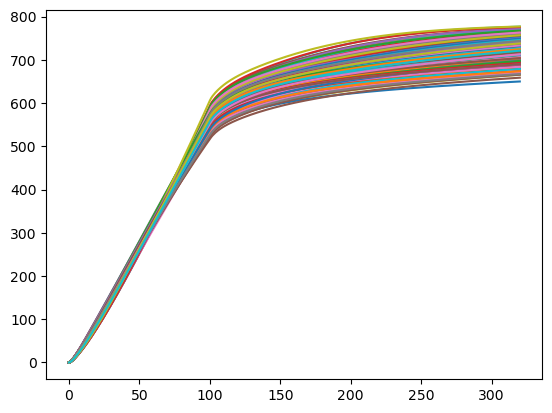

In [783]:
plt.plot(np.cumsum(f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",)].sum('gasbox'),0)/cf)

In [784]:
temp = f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = 0,)]
lifetime = f_nonSD.species_configs.unperturbed_lifetime.loc[dict(specie="CO2",gasbox = gasbox,)]
(lifetime.isel(config = 0)).values

NameError: name 'gasbox' is not defined

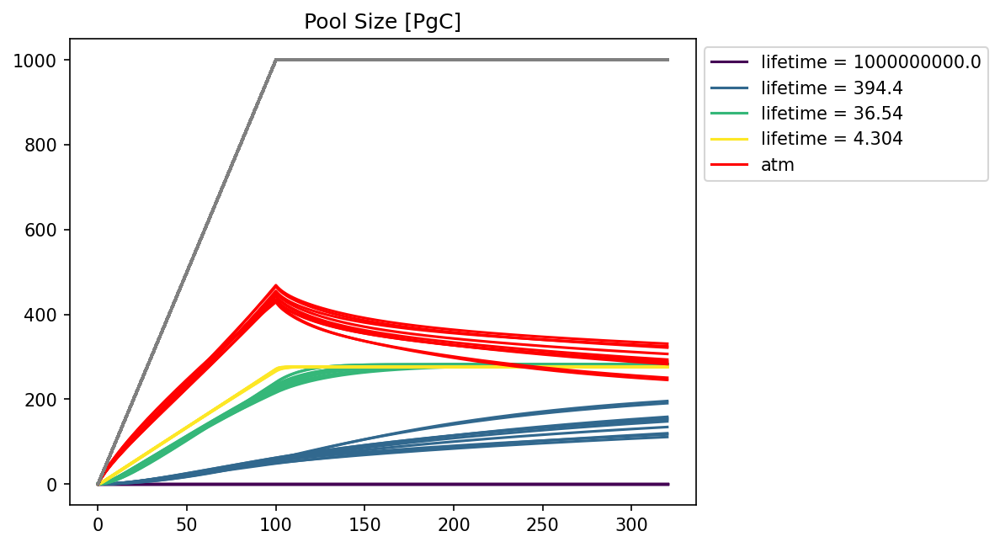

In [792]:
plt.figure(dpi = 150)
for gasbox in range(0,4):
    lifetime = f_nonSD.species_configs.unperturbed_lifetime.loc[dict(specie="CO2",gasbox = gasbox,)]
    flux = f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = gasbox,)]
    flux = f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = gasbox,)]
    plt.plot(np.cumsum(flux.isel(config = 0)/cf,0),color = new_colors[gasbox], label = f'lifetime = {lifetime.isel(config = 0).values}')
    plt.plot(np.cumsum(flux.isel(config = slice(1,10))/cf,0),color = new_colors[gasbox])

atm_pool = f_nonSD.airborne_emissions.loc[dict(specie="CO2",
                                             scenario="esm-flat10_zec",)]
plt.plot(atm_pool.isel(config = 0)/cf,color = 'r', label = 'atm')
plt.plot(atm_pool.isel(config = slice(1,10))/cf,color = 'r',)

plt.plot((np.cumsum(f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",)].sum('gasbox'),0)+atm_pool)/cf,color = 'grey', )

plt.title('Pool Size [PgC]')
plt.legend(bbox_to_anchor=(1,1))


In [793]:
dCro_nonSD = f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = 0,)]/cf
dCla_nonSD = f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = 2,)]/cf
dDIC_nonSD = (f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = 1,)] + f_nonSD.flux.loc[dict(specie="CO2",scenario="esm-flat10_zec",gasbox = 3,)])/cf

dCatm_nonSD = f_nonSD.airborne_emissions.loc[dict(specie="CO2",
                                             scenario="esm-flat10_zec",)]/cf

In [ ]:
dCla_defSD = (f_defSD.co2_partitions.isel(scenario = 0,
                      specie = 0,
                      gasbox = slice(21,31)
                             ).sum('gasbox')- f_defSD.co2_partitions.isel(timebounds = 1,
                                                            scenario = 0,
                                                            specie = 0,
                                                            gasbox = slice(21,31)
                                                                   ).sum('gasbox')) * PL['Ala']*12e-15
dCatm_defSD = ((f_defSD.co2_partitions.isel(scenario = 0,
                      specie = 0,
                      gasbox = 30
                     ) - f_defSD.co2_partitions.isel(timebounds = 1, scenario = 0,
                      specie = 0,
                      gasbox = 30
                     ))*PE['ma']*12e-15)
dDIC_defSD = ((f_defSD.co2_partitions.isel(scenario = 0,
                  specie = 0,
                  gasbox = slice(14,21))*PO['V']).sum('gasbox') - (f_defSD.co2_partitions.isel(timebounds = 1, scenario = 0,
                  specie = 0,
                  gasbox = slice(14,21))*PO['V']).sum('gasbox'))*12e-15
dNut_defSD = ((f_defSD.co2_partitions.isel(scenario = 0,
                  specie = 0,
                  gasbox = slice(7,14))*PO['V']).sum('gasbox') - (f_defSD.co2_partitions.isel(timebounds = 1,
                                                                                        scenario = 0,
                                                                                        specie = 0,
                  gasbox = slice(7,14))*PO['V']).sum('gasbox'))*12e-15

In [198]:
dCla_yesSD = (f_yesSD.co2_partitions.isel(scenario = 0,
                      specie = 0,
                      gasbox = slice(21,31)
                             ).sum('gasbox')- f_yesSD.co2_partitions.isel(timebounds = 1,
                                                            scenario = 0,
                                                            specie = 0,
                                                            gasbox = slice(21,31)
                                                                   ).sum('gasbox')) * PL['Ala']*12e-15
dCatm_yesSD = ((f_yesSD.co2_partitions.isel(scenario = 0,
                      specie = 0,
                      gasbox = 30
                     ) - f_yesSD.co2_partitions.isel(timebounds = 1, scenario = 0,
                      specie = 0,
                      gasbox = 30
                     ))*PE['ma']*12e-15)
dDIC_yesSD = ((f_yesSD.co2_partitions.isel(scenario = 0,
                  specie = 0,
                  gasbox = slice(14,21))*PO['V']).sum('gasbox') - (f_yesSD.co2_partitions.isel(timebounds = 1, scenario = 0,
                  specie = 0,
                  gasbox = slice(14,21))*PO['V']).sum('gasbox'))*12e-15
dNut_yesSD = ((f_yesSD.co2_partitions.isel(scenario = 0,
                  specie = 0,
                  gasbox = slice(7,14))*PO['V']).sum('gasbox') - (f_yesSD.co2_partitions.isel(timebounds = 1,
                                                                                        scenario = 0,
                                                                                        specie = 0,
                  gasbox = slice(7,14))*PO['V']).sum('gasbox'))*12e-15

Text(0.5, 1.0, 'FaIR with SD Carbon Cycle \n 200 ensemble members, modified SD CC params')

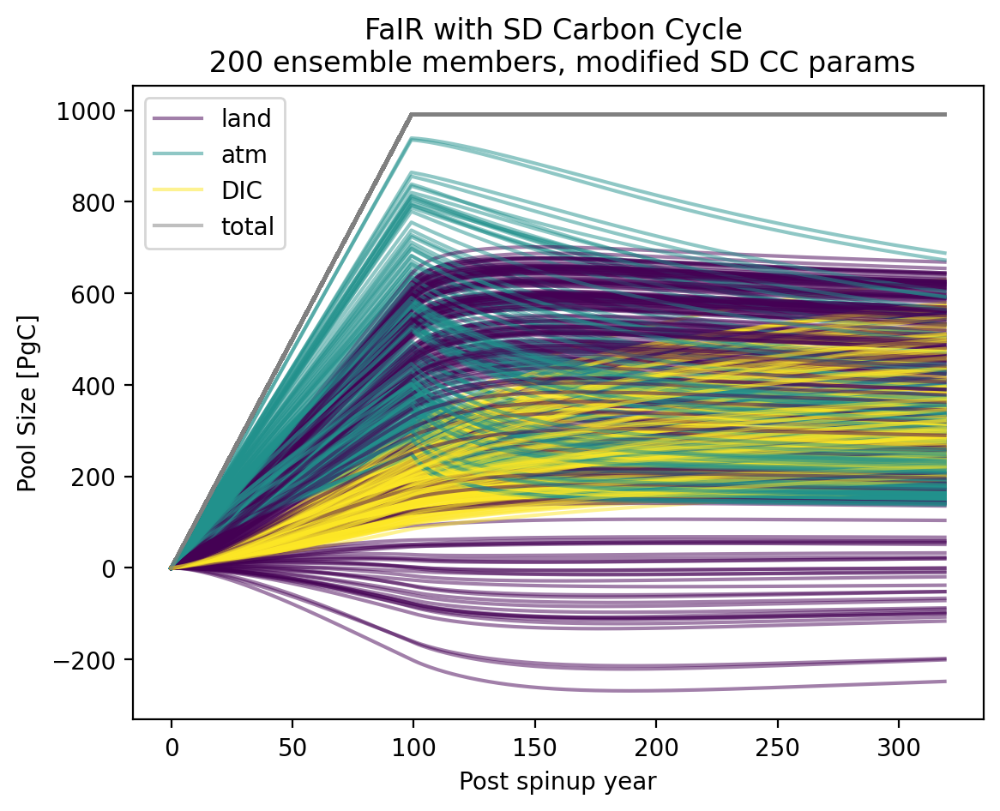

In [74]:
plt.figure(dpi = 200)
for i in range(f_yesSD._n_configs):
    if i == 0:
        plt.plot(dCla_yesSD[1:,i],color = colors[0], alpha = 0.5,label = 'land')
        plt.plot(dCatm_yesSD[1:,i], color = colors[1], alpha = 0.5,label = 'atm')
        plt.plot(dDIC_yesSD[1:,i], color = colors[2], alpha = 0.5,label = 'DIC')
        plt.plot((dCla_yesSD+dCatm_yesSD+dDIC_yesSD+dNut_yesSD)[1:,i], color = 'grey',alpha = 0.5, label = 'total')
    else:
        plt.plot(dCla_yesSD[1:,i],color = colors[0], alpha = 0.5, label = '_land')
        plt.plot(dCatm_yesSD[1:,i], color = colors[1], alpha = 0.5, label = '_atm')
        plt.plot(dDIC_yesSD[1:,i], color = colors[2], alpha = 0.5, label = '_DIC')
        plt.plot((dCla_yesSD+dCatm_yesSD+dDIC_yesSD+dNut_yesSD)[1:,i], color = 'grey',alpha = 0.5, label = '_total')

# plt.axhline(1000)
plt.legend(loc = 'best',
#            bbox_to_anchor = (1,1)
          )
plt.ylabel('Pool Size [PgC]')
plt.xlabel('Post spinup year')
plt.title(f'FaIR with SD Carbon Cycle \n {f_yesSD._n_configs} ensemble members, modified SD CC params')

NameError: name 'f_defSD' is not defined

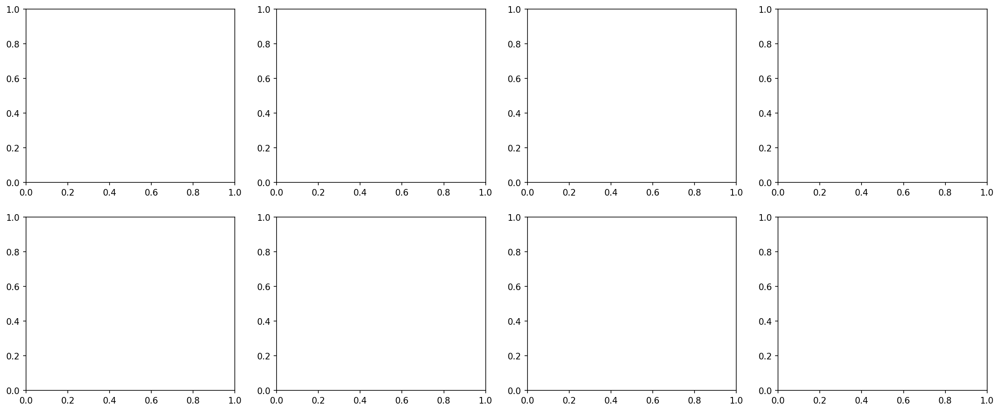

In [41]:
fig, ax = plt.subplots(2, 4, figsize = (20,8),dpi = 150,)
ax[0,0].plot(f_defSD.timepoints, f_defSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[0,1].plot(f_defSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[0,2].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[1,0].plot(f_yesSD.timepoints, f_yesSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1,1].plot(f_yesSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1,2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);
ax[1,3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0,0].set_title('emissions [PgC]')
ax[0,1].set_title('cumulative emissions [PgC]')
ax[0,2].set_title('atm CO2 concentration [ppm]')
ax[0,3].set_title('change in surface T [K]')

ax[0,2].set_ylim([280,475])
ax[1,2].set_ylim([280,475])
ax[0,3].set_ylim([-.1,2.3])
ax[1,3].set_ylim([-.1,2.3])

ax[0,0].set_ylabel('default SD CC params')
ax[1,0].set_ylabel('modified SD CC params')

AttributeError: 'Dataset' object has no attribute 'concentration'

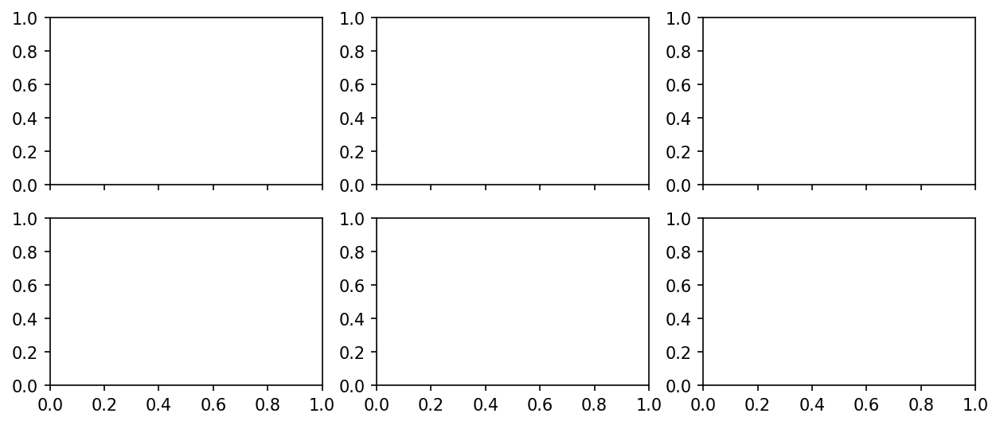

In [194]:
fig, ax = plt.subplots(2, 3, figsize = (10,4),dpi = 150, sharex=True)

# ax[0,0].plot(f_nonSD.timepoints, f_nonSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[0,1].plot(f_nonSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# concentration

ax[0,0].plot(f_nonSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,1].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);


ax[1,0].plot(f_nonSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,0].plot(f_nonSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[1,1].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,1].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[1,2].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,2].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0,0].set_title('nonSD')
ax[0,1].set_title('defSD')
ax[0,2].set_title('modSD')

ax[0,0].set_ylim([280,520])
ax[0,1].set_ylim([280,520])
ax[0,2].set_ylim([280,520])
ax[1,0].set_ylim([-.1,4])
ax[1,1].set_ylim([-.1,4])
ax[1,2].set_ylim([-.1,4])

ax[0,0].set_ylabel('concentration [ppm]')
ax[1,0].set_ylabel('temperature change [K]')


In [ ]:
# Check to see that I still have parameter ranges
print(beta_550_bounds,Q10_resp_bounds,kwScalar_bounds,PsiScalar_bounds,dPsidb_bounds)

In [56]:
def beta550_to_betafert(beta_550):
    beta_fert = (beta_550 - 1) / np.log(550 / 365)
    return beta_fert

In [54]:
# beta550_to_betafert(f_gcbSD.carbon_configs.gems_beta_550.data)
beta550_to_betafert(1.55)

1.341394955580628

Text(0, 0.5, 'modified SD CC params')

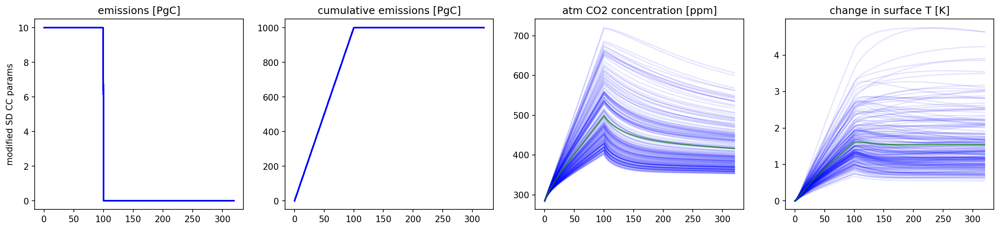

In [384]:
fig, ax = plt.subplots(1, 4, figsize = (20,4),dpi = 150)
# ax[0].plot(f_defSD.timepoints, f_defSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[1].plot(f_defSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[2].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0].plot(f_yesSD.timepoints, f_yesSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1].plot(f_yesSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);
ax[3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0].set_title('emissions [PgC]')
ax[1].set_title('cumulative emissions [PgC]')
ax[2].set_title('atm CO2 concentration [ppm]')
ax[3].set_title('change in surface T [K]')

# ax[0,0].set_ylabel('default SD CC params')
ax[0].set_ylabel('modified SD CC params')

Text(0, 0.5, 'modified SD CC params')

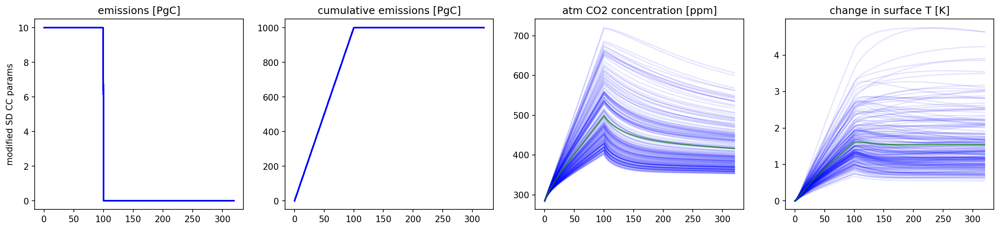

In [196]:
fig, ax = plt.subplots(1, 4, figsize = (20,4),dpi = 150)
# ax[0].plot(f_defSD.timepoints, f_defSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[1].plot(f_defSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[2].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0].plot(f_yesSD.timepoints, f_yesSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1].plot(f_yesSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);
ax[3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0].set_title('emissions [PgC]')
ax[1].set_title('cumulative emissions [PgC]')
ax[2].set_title('atm CO2 concentration [ppm]')
ax[3].set_title('change in surface T [K]')

# ax[0,0].set_ylabel('default SD CC params')
ax[0].set_ylabel('modified SD CC params')

Text(0, 0.5, 'FaIR')

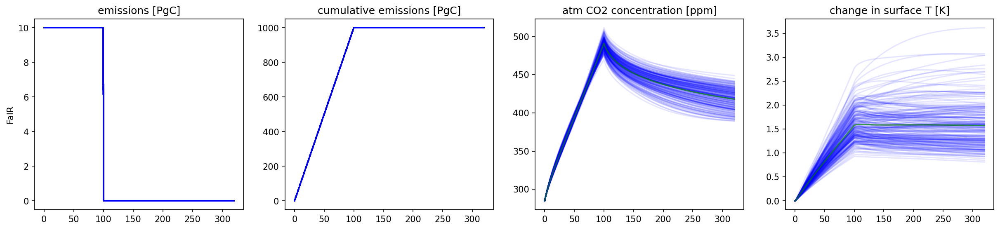

In [795]:
fig, ax = plt.subplots(1, 4, figsize = (20,4),dpi = 150)
# ax[0].plot(f_defSD.timepoints, f_defSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[1].plot(f_defSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
# ax[2].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[3].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0].plot(f_nonSD.timepoints, f_yesSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1].plot(f_nonSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[2].plot(f_nonSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[2].plot(f_nonSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);
ax[3].plot(f_nonSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[3].plot(f_nonSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0].set_title('emissions [PgC]')
ax[1].set_title('cumulative emissions [PgC]')
ax[2].set_title('atm CO2 concentration [ppm]')
ax[3].set_title('change in surface T [K]')

ax[0].set_ylabel('FaIR')

Text(0, 0.5, 'modified SD CC params')

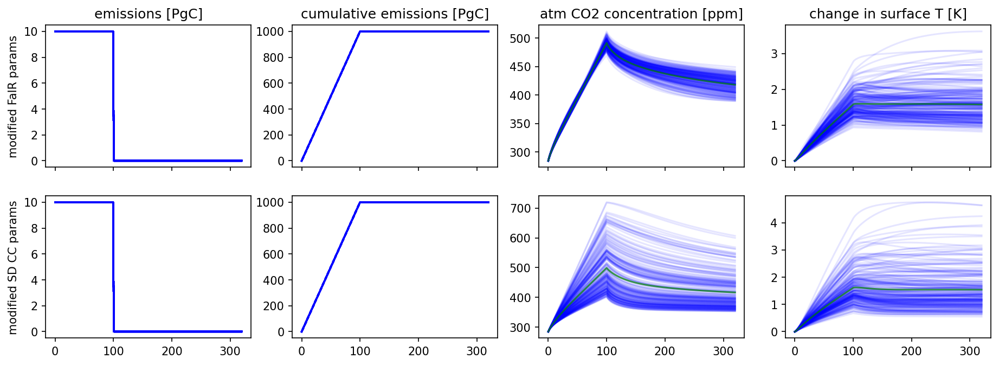

In [799]:
fig, ax = plt.subplots(2, 4, figsize = (15,5),dpi = 150, sharex = True)

ax[0,0].plot(f_nonSD.timepoints, f_yesSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[0,1].plot(f_nonSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[0,2].plot(f_nonSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,2].plot(f_nonSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);
ax[0,3].plot(f_nonSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[0,3].plot(f_nonSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[1,0].plot(f_yesSD.timepoints, f_yesSD.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1,1].plot(f_yesSD.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")]/cf, color='b', alpha=0.1);
ax[1,2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,2].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);
ax[1,3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
ax[1,3].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), color='g', alpha=0.7);

ax[0, 0].set_title('emissions [PgC]')
ax[0, 1].set_title('cumulative emissions [PgC]')
ax[0, 2].set_title('atm CO2 concentration [ppm]')
ax[0, 3].set_title('change in surface T [K]')

ax[0,0].set_ylabel('modified FaIR params')
ax[1,0].set_ylabel('modified SD CC params')

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_4343/2938418962.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = plt.colorbar(scalar_map)


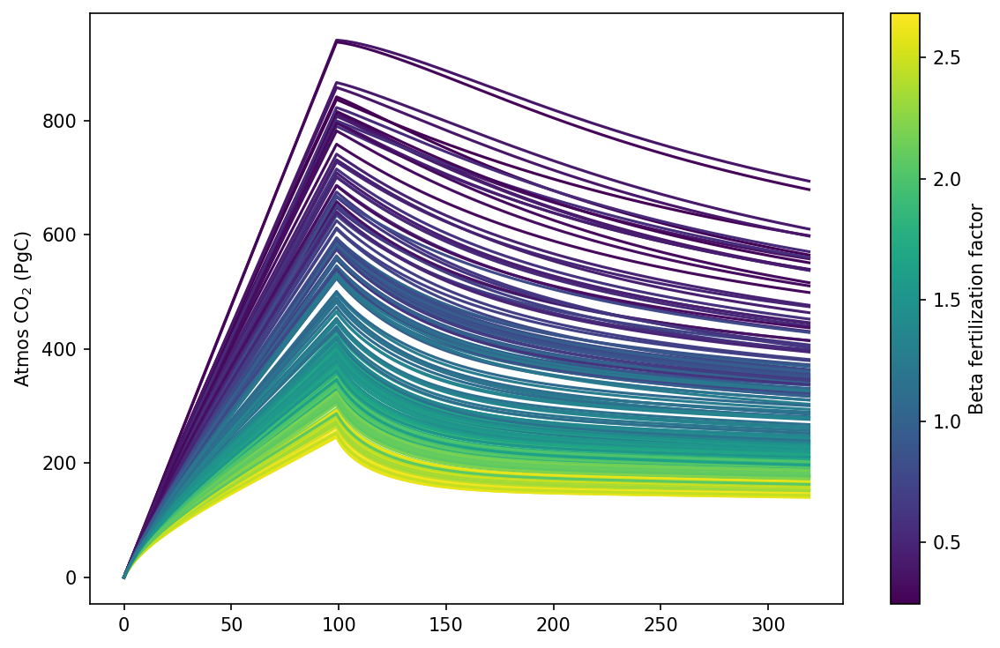

In [199]:
# color by beta_fert (not beta_550)

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig = plt.figure(figsize=(8, 5),dpi = 150)
norm = Normalize(vmin=beta550_to_betafert(beta_550_bounds[0]), vmax=beta550_to_betafert(beta_550_bounds[1]))
scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)

for i in range(len(f_yesSD.configs)):
#     param = beta550_to_betafert(config_ens[i][0])
    param = beta550_to_betafert(f_yesSD.carbon_configs.gems_beta_550.data)[i]
#     C_atm = parameters_dataset.data_vars[f'ensemble_{i}'].sel(pools='C_atm')[5000:] * PE['ma'] * 12e-15 #/ 2.12
    C_atm = dCatm_yesSD.isel(config = i)
#     if np.round(C_atm[170],2) == np.round(C_atm[100],2):
#         print(config_ens[i])
#         pass
#     else:
    plt.plot(C_atm[1:],
             color=scalar_map.to_rgba(param),
             label='_%s' % np.round(param, 2))

# Create colorbar
cb = plt.colorbar(scalar_map)
cb.set_label('Beta fertilization factor')

# plt.legend()
plt.ylabel(r'Atmos CO$_2$ (PgC)')
plt.tight_layout()
plt.show()
plt.close()

# fpath = '../../../Decarbonization/Simple_MIP/FaIR_Swann/'
# fname = 'SD_PPE_beta_fert_flat10_zec_PgC'
# # save the plot
# fig.savefig(ffname +'.png', bbox_inches='tight')
# print('done saving file')

# show the plot:
plt.show()
plt.close()


In [220]:
config_index = gems_cal_1_2_0_df['Unnamed: 0']
config_index

0        1230
1        1715
2        2658
3        3898
4        5915
        ...  
195    296233
196    296477
197    297672
198    298383
199    299646
Name: Unnamed: 0, Length: 200, dtype: int64

In [213]:
# read in constrained configs:

# gems_constrained_configs = np.array(lst3)

# Save the array to a binary file
import datetime

list_of_constraints: ['constrained_gems','constrained_by_gr','constrained_by_co2', 'constrained_by_T']


# Load the saved arrays

constrained_gems = np.load(f'constrained_gems_1639_03152024.npy')
constrained_by_gr = np.load(f'constrained_by_gr_1639_03152024.npy')
constrained_by_co2 = np.load(f'constrained_by_co2_1639_03152024.npy')
constrained_by_T = np.load(f'constrained_by_T_1639_03152024.npy')
print(constrained_by_T)
print(constrained_by_co2)
print(constrained_by_gr)
print(constrained_gems)

[  3   7   8   9  11  14  16  19  21  23  24  27  29  30  31  38  39  42
  45  46  47  55  57  59  60  66  70  74  81  84  87  88  90  95  96  97
 104 108 113 126 127 139 140 141 147 149 156 157 158 159 160 163 165 166
 168 171 172 175 178 179 180 181 186 188 190 196 197 198]
[  1  11  15  19  21  24  38  45  57  84  90  96 104 111 127 146 147 172
 179 193]
[  1   7   8  11  14  15  16  18  19  20  21  24  27  28  31  32  38  42
  43  45  46  47  50  53  55  57  58  59  60  65  68  70  71  73  74  76
  77  83  84  87  90  93  95  96  97 104 109 111 115 118 127 129 130 136
 138 139 142 146 147 156 163 165 166 169 172 173 178 179 180 181 182 183
 184 185 190 193 194 195 197 199]
[  1   3   7   8   9  11  14  15  16  18  19  20  21  23  24  27  28  29
  30  31  32  38  39  42  43  45  46  47  50  53  55  57  58  59  60  65
  66  68  70  71  73  74  76  77  81  83  84  87  88  90  93  95  96  97
 104 108 109 111 113 115 118 126 127 129 130 136 138 139 140 141 142 146
 147 149 156 157 158 1

In [216]:
constrained_by_co2

array([  1,  11,  15,  19,  21,  24,  38,  45,  57,  84,  90,  96, 104,
       111, 127, 146, 147, 172, 179, 193])

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_4343/1419193284.py:32: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = plt.colorbar(scalar_map)


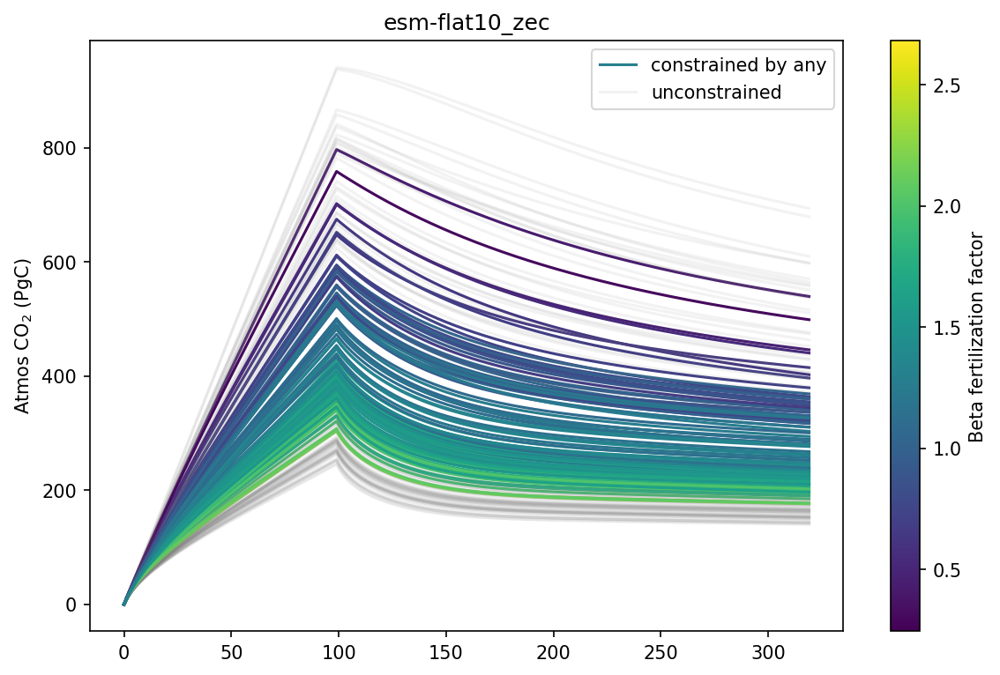

In [229]:
# color by beta_fert (not beta_550)

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig = plt.figure(figsize=(8, 5),dpi = 150)
norm = Normalize(vmin=beta550_to_betafert(beta_550_bounds[0]), vmax=beta550_to_betafert(beta_550_bounds[1]))
scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)

for i in range(len(f_yesSD.configs)):
    param = beta550_to_betafert(f_yesSD.carbon_configs.gems_beta_550.data)[i]
    C_atm = dCatm_yesSD.isel(config = i)
    if i in constrained_gems:
        p1 = plt.plot(C_atm[1:],
                     color=scalar_map.to_rgba(param),
                     label='constrained by any')
    
#     if config_index[i] in constrained_gems:
#         p1 = plt.plot(C_atm[1:],
#                      color=scalar_map.to_rgba(param),
#                      label='total constrained')
    else:
        p2 = plt.plot(C_atm[1:],
                      color='grey',
                      alpha = 0.1,
                      label='unconstrained')
        

# Create colorbar
cb = plt.colorbar(scalar_map)
cb.set_label('Beta fertilization factor')
plt.legend(handles = [p1[0],p2[0]])

# plt.legend()
plt.ylabel(r'Atmos CO$_2$ (PgC)')
plt.tight_layout()
plt.title(f'{f_yesSD.scenarios[0]}')
plt.show()
plt.close()

# fpath = '../../../Decarbonization/Simple_MIP/FaIR_Swann/'
# fname = 'SD_PPE_beta_fert_flat10_zec_PgC'
# # save the plot
# fig.savefig(ffname +'.png', bbox_inches='tight')
# print('done saving file')

# show the plot:
plt.show()
plt.close()


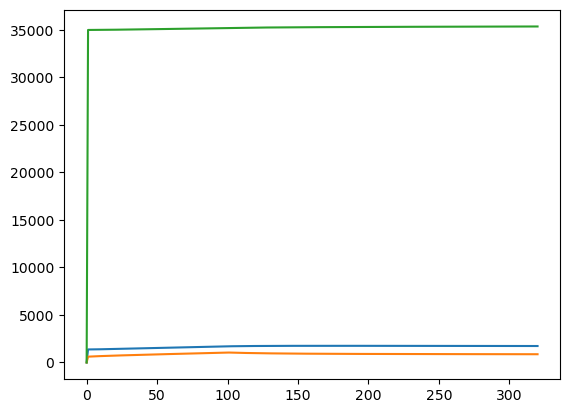

In [293]:
plt.plot((f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcla']).isel(config=i)*PL['Ala']* 12e-15).sum('gasbox'))
plt.plot(f_yesSD.airborne_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(config = i)/cf)
plt.plot((f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcoc']).isel(config=i)*PO['V']* 12e-15).sum('gasbox'))

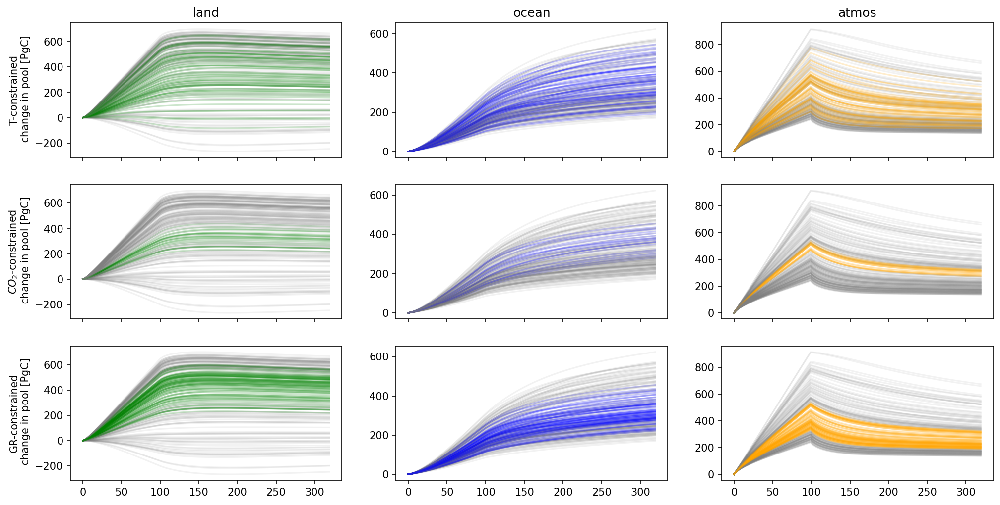

In [312]:
# Plot pools:

fig, ax = plt.subplots(3, 3, figsize = (16,8), dpi = 150, sharex = True)

for i in range(len(f_yesSD.configs)):
    Cla = (f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcla']).isel(config=i)*PL['Ala']* 12e-15).sum('gasbox')
    dCla = Cla[1:]-Cla[1]
    Coc = (f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcoc']).isel(config=i)*PO['V']* 12e-15).sum('gasbox')
    dCoc = Coc[1:]-Coc[1]
    Cat = f_yesSD.airborne_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(config = i)/cf
    dCat = Cat[1:]-Cat[1]
    if i in constrained_by_T:
        land_T = ax[0,0].plot(Cla[1:]-Cla[1], c = 'g', alpha = 0.2,)
        ocean_T = ax[0,1].plot(Coc[1:]-Coc[1], c = 'b', alpha = 0.2,)
        atm_T = ax[0,2].plot(Cat[1:]-Cat[1], c = 'orange', alpha = 0.2,)
    else:
        land_T = ax[0,0].plot(Cla[1:]-Cla[1], c = 'grey', alpha = 0.1,)
        ocean_T = ax[0,1].plot(Coc[1:]-Coc[1], c = 'grey', alpha = 0.1,)
        atm_T = ax[0,2].plot(Cat[1:]-Cat[1], c = 'grey', alpha = 0.1,)
    if i in constrained_by_co2:
        land_co2 = ax[1,0].plot(Cla[1:]-Cla[1], c = 'g', alpha = 0.2,)
        ocean_co2 = ax[1,1].plot(Coc[1:]-Coc[1], c = 'b', alpha = 0.2,)
        atm_co2 = ax[1,2].plot(Cat[1:]-Cat[1], c = 'orange', alpha = 0.2,)
    else:
        land_co2 = ax[1,0].plot(Cla[1:]-Cla[1], c = 'grey', alpha = 0.1,)
        ocean_co2 = ax[1,1].plot(Coc[1:]-Coc[1], c = 'grey', alpha = 0.1,)
        atm_co2 = ax[1,2].plot(Cat[1:]-Cat[1], c = 'grey', alpha = 0.1,)
    if i in constrained_by_gr:
        land_gr = ax[2,0].plot(Cla[1:]-Cla[1], c = 'g', alpha = 0.2,)
        ocean_gr = ax[2,1].plot(Coc[1:]-Coc[1], c = 'b', alpha = 0.2,)
        atm_gr = ax[2,2].plot(Cat[1:]-Cat[1], c = 'orange', alpha = 0.2,)
    else:
        land_gr = ax[2,0].plot(Cla[1:]-Cla[1], c = 'grey', alpha = 0.1,)
        ocean_gr = ax[2,1].plot(Coc[1:]-Coc[1], c = 'grey', alpha = 0.1,)
        atm_gr = ax[2,2].plot(Cat[1:]-Cat[1], c = 'grey', alpha = 0.1,)

ax[1,0].set_ylim(ax[0,0].get_ylim());ax[2,0].set_ylim(ax[0,0].get_ylim())

ax[1,1].set_ylim(ax[0,1].get_ylim());ax[2,1].set_ylim(ax[0,1].get_ylim())

ax[1,2].set_ylim(ax[0,2].get_ylim());ax[2,2].set_ylim(ax[0,2].get_ylim())

ax[0,0].set_ylabel('T-constrained\n change in pool [PgC]')
ax[1,0].set_ylabel('$CO_2$-constrained\n change in pool [PgC]')
ax[2,0].set_ylabel('GR-constrained\n change in pool [PgC]')

ax[0,0].set_title('land')
ax[0,1].set_title('ocean')
ax[0,2].set_title('atmos')

plt.show();plt.close()

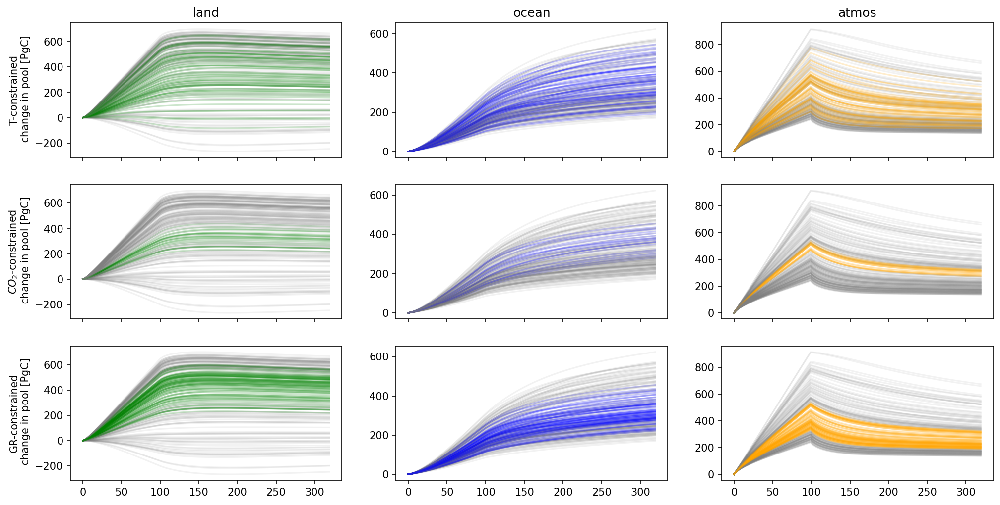

In [329]:
# Plot pools:

fig, ax = plt.subplots(3, 3, figsize = (16,8), dpi = 150, sharex = True)

for i in range(len(f_yesSD.configs)):
    Cla = (f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcla']).isel(config=i)*PL['Ala']* 12e-15).sum('gasbox')
    dCla = Cla[1:]-Cla[1]
    Coc = (f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcoc']).isel(config=i)*PO['V']* 12e-15).sum('gasbox')
    dCoc = Coc[1:]-Coc[1]
    Cat = f_yesSD.airborne_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(config = i)/cf
    dCat = Cat[1:]-Cat[1]
    if i in constrained_by_T:
        land_T = ax[0,0].plot(dCla, c = 'g', alpha = 0.2,)
        ocean_T = ax[0,1].plot(dCoc, c = 'b', alpha = 0.2,)
        atm_T = ax[0,2].plot(dCat, c = 'orange', alpha = 0.2,)
    else:
        land_T = ax[0,0].plot(dCla, c = 'grey', alpha = 0.1,)
        ocean_T = ax[0,1].plot(dCoc, c = 'grey', alpha = 0.1,)
        atm_T = ax[0,2].plot(dCat, c = 'grey', alpha = 0.1,)
    if i in constrained_by_co2:
        land_co2 = ax[1,0].plot(dCla, c = 'g', alpha = 0.2,)
        ocean_co2 = ax[1,1].plot(dCoc, c = 'b', alpha = 0.2,)
        atm_co2 = ax[1,2].plot(dCat, c = 'orange', alpha = 0.2,)
    else:
        land_co2 = ax[1,0].plot(dCla, c = 'grey', alpha = 0.1,)
        ocean_co2 = ax[1,1].plot(dCoc, c = 'grey', alpha = 0.1,)
        atm_co2 = ax[1,2].plot(dCat, c = 'grey', alpha = 0.1,)
    if i in constrained_by_gr:
        land_gr = ax[2,0].plot(dCla, c = 'g', alpha = 0.2,)
        ocean_gr = ax[2,1].plot(dCoc, c = 'b', alpha = 0.2,)
        atm_gr = ax[2,2].plot(dCat, c = 'orange', alpha = 0.2,)
    else:
        land_gr = ax[2,0].plot(dCla, c = 'grey', alpha = 0.1,)
        ocean_gr = ax[2,1].plot(dCoc, c = 'grey', alpha = 0.1,)
        atm_gr = ax[2,2].plot(dCat, c = 'grey', alpha = 0.1,)

ax[1,0].set_ylim(ax[0,0].get_ylim());ax[2,0].set_ylim(ax[0,0].get_ylim())

ax[1,1].set_ylim(ax[0,1].get_ylim());ax[2,1].set_ylim(ax[0,1].get_ylim())

ax[1,2].set_ylim(ax[0,2].get_ylim());ax[2,2].set_ylim(ax[0,2].get_ylim())

ax[0,0].set_ylabel('T-constrained\n change in pool [PgC]')
ax[1,0].set_ylabel('$CO_2$-constrained\n change in pool [PgC]')
ax[2,0].set_ylabel('GR-constrained\n change in pool [PgC]')

ax[0,0].set_title('land')
ax[0,1].set_title('ocean')
ax[0,2].set_title('atmos')

plt.show();plt.close()

In [ ]:
# Timescales of uptake, following https://github.com/ckoven/flat10/blob/main/flat10-analysis.ipynb

In [381]:
# define a simple exponential memory function that relates sink strength to prior emissions, and fit to CESM2, starting with the land sink
display(Math(r'$S(t) = \int_{0}^t E(t_{e}) \, a \, e^{\frac{-(t - t_{e})}{\tau}}\,dt_{e}$'))

<IPython.core.display.Math object>

In [319]:
def memory(emissions, tau, sens):
    nt = len(emissions)
    sink = np.zeros(nt)
    for t in range(nt):
        r = 0
        for tt in range(t):
            r = r + emissions[tt] * sens * np.exp(-(t-tt)/tau)
        sink[t] = r
    return sink

In [322]:
def memory_xr(emissions, tau, sens):
    nt = len(emissions)
    sink = 0.*emissions['time']*tau
    for t in range(nt):
        r = 0
        for tt in range(t):
            r = r + emissions[tt] * sens * np.exp(-(t-tt)/tau)
        sink.loc[dict(time=t)] = r
    return sink

In [399]:
constrained_config_index = gems_cal_1_2_0_df['Unnamed: 0'][constrained_gems]
constrained_config_index

1        1715
3        3898
7        7996
8        8383
9        9214
        ...  
195    296233
196    296477
197    297672
198    298383
199    299646
Name: Unnamed: 0, Length: 106, dtype: int64

In [536]:
constraint = constrained_gems
land_pool = (f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcla'])*PL['Ala']* 12e-15).sum('gasbox')[1:]
land_pool_constrained = land_pool[:,constraint]
land_flux = np.diff(np.mean(land_pool_constrained,1))
# land_flux = np.diff(land_pool_constrained, axis = 0)
ocean_pool = (f_yesSD.co2_partitions.loc[dict(specie="CO2", scenario="esm-flat10_zec")].isel(gasbox = PE['Jcoc'])*PO['V']* 12e-15).sum('gasbox')[1:]
ocean_pool_constrained = ocean_pool[:,constraint]
ocean_flux = np.diff(np.mean(ocean_pool_constrained,1))
# ocean_flux = np.diff(ocean_pool_constrained, axis = 0)


In [537]:
np.shape(ocean_flux)

(319,)

In [540]:
## define emissions timeseries and land/ocean sinks across full scenarios

emiss_zec = np.zeros(419)
# emiss_zec = np.zeros([419,len(constraint)])
emiss_zec[100:200] = 10.

time_zec = np.arange(len(emiss_zec)) - 100.

landsink_zec = np.zeros(419)
# landsink_zec = np.zeros([419,len(constraint)])
landsink_zec[101:200] = land_flux[1:100]
landsink_zec[200:] = land_flux[100:] #post net-zero

oceansink_zec = np.zeros(419)
# oceansink_zec = np.zeros([419,len(constraint)])
oceansink_zec[101:200] = ocean_flux[1:100]
oceansink_zec[200:] = ocean_flux[100:] #post net-zero


Text(0.5, 0, 'time (yr)')

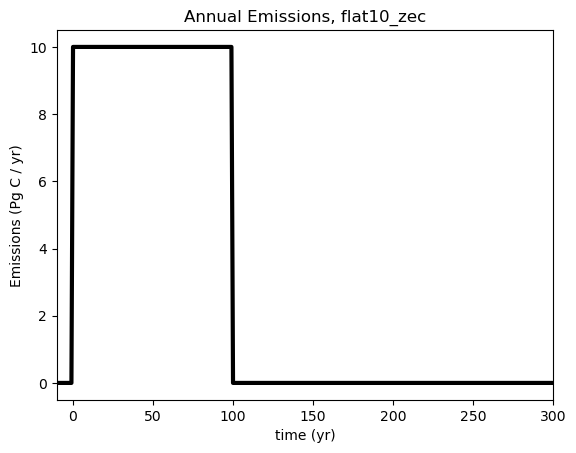

In [541]:
linewidth = 3
plt.plot(time_zec, emiss_zec, color='black', linewidth=linewidth)

plt.xlim([-10,300])
plt.title('Annual Emissions, flat10_zec')
plt.ylabel('Emissions (Pg C / yr)')
plt.xlabel('time (yr)')

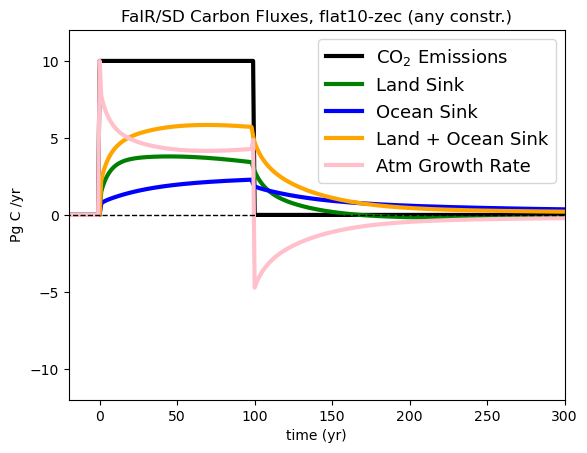

In [544]:
### first make a plot of emissions, land sink, ocean sink, and airborne growth rate
linewidth = 3
alpha = 1
p1 = plt.plot(time_zec, emiss_zec, color='black', linewidth=linewidth, label = 'CO$_2$ Emissions')
p2 = plt.plot(time_zec, landsink_zec, color='green', linewidth=linewidth, alpha = alpha, label = 'Land Sink')
p3 = plt.plot(time_zec, oceansink_zec, color='blue', linewidth=linewidth, alpha = alpha, label = 'Ocean Sink')
p4 = plt.plot(time_zec, (oceansink_zec + landsink_zec), color='orange', linewidth=linewidth, alpha = alpha, label = 'Land + Ocean Sink')
p5 = plt.plot(time_zec, emiss_zec - (oceansink_zec + landsink_zec), color='pink', linewidth=linewidth, alpha = alpha, label = 'Atm Growth Rate')

if np.array_equal(constraint,constrained_by_T):
    title_append = '(T-constr.)'
elif np.array_equal(constraint,constrained_by_co2):
    title_append = '($CO_2$-constr.)'
elif np.array_equal(constraint,constrained_by_gr):
    title_append = '(GR-constr.)'
elif np.array_equal(constraint,constrained_gems):
    title_append = '(any constr.)'
else:
    title_append = '(undefined constr.)'
plt.title(f'FaIR/SD Carbon Fluxes, flat10-zec {title_append}')
plt.ylabel('Pg C /yr')
plt.xlabel('time (yr)')
plt.xlim([-20,300])
plt.ylim([-12,12])
plt.hlines(0., -100, 500, color='black', linestyle='dashed', linewidth=1)
plt.legend(handles = [p1[0],p2[0],p3[0],p4[0],p5[0]],
           fontsize="13")

plt.show();plt.close()

In [545]:
params, fit = scipy.optimize.curve_fit(memory, emiss_zec[100:200], landsink_zec[100:200], [12., 0.03])
print(params)

[4.01538386 0.10374025]


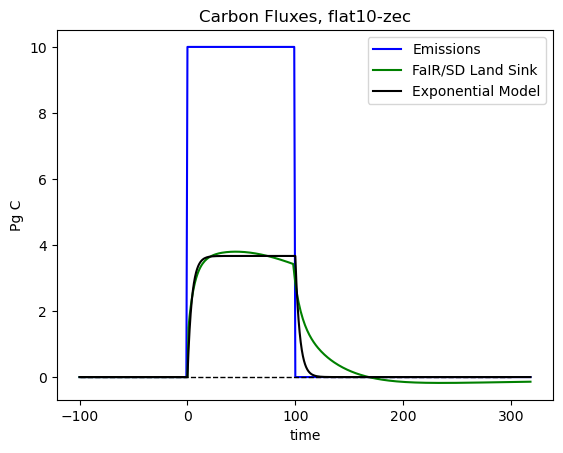

In [556]:
pred_landsink_zec = memory(emiss_zec, params[0], params[1])

plt.plot(time_zec, emiss_zec, color='blue')
plt.plot(time_zec, landsink_zec, color='green')
plt.plot(time_zec, pred_landsink_zec, color='black')

plt.title('Carbon Fluxes, flat10-zec')
plt.ylabel('Pg C')
plt.xlabel('time')
plt.hlines(0., -100, 300, color='black', linestyle='dashed', linewidth=1)
plt.legend(['Emissions','FaIR/SD Land Sink','Exponential Model'])
plt.savefig('landc_zec_response', dpi=300)

In [547]:
params_ocean, fit_ocean = scipy.optimize.curve_fit(memory, emiss_zec[100:200], oceansink_zec[100:200], [12., 0.03])
print(params_ocean)

[1.64338771e+01 1.34767306e-02]


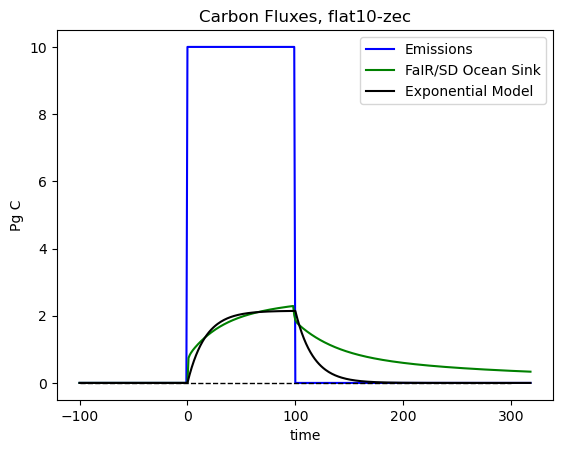

In [555]:
pred_oceansink_zec = memory(emiss_zec, params_ocean[0], params_ocean[1])

plt.plot(time_zec, emiss_zec, color='blue')
plt.plot(time_zec, oceansink_zec, color='green')
plt.plot(time_zec, pred_oceansink_zec, color='black')

plt.title('Carbon Fluxes, flat10-zec')
plt.ylabel('Pg C')
plt.xlabel('time')
plt.hlines(0., -100, 300, color='black', linestyle='dashed', linewidth=1)
plt.legend(['Emissions','FaIR/SD Ocean Sink','Exponential Model'])

In [549]:
# and now do the fit to combined land plus ocean sink
params_total, fit_total = scipy.optimize.curve_fit(memory, emiss_zec[100:200], oceansink_zec[100:200] + landsink_zec[100:200], [12., 0.03])
print(params_ocean)

[1.64338771e+01 1.34767306e-02]


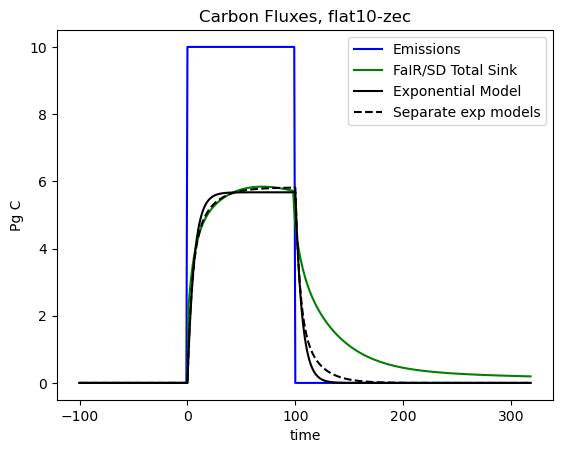

In [550]:
pred_totalsink_zec = memory(emiss_zec, params_total[0], params_total[1])

plt.plot(time_zec, emiss_zec, color='blue')
plt.plot(time_zec, oceansink_zec+landsink_zec, color='green')
plt.plot(time_zec, pred_totalsink_zec, color='black')
plt.plot(time_zec, pred_landsink_zec + pred_oceansink_zec, color='black', linestyle='dashed')


plt.title('Carbon Fluxes, flat10-zec')
plt.ylabel('Pg C')
plt.xlabel('time')
plt.legend(['Emissions','FaIR/SD Total Sink','Exponential Model', 'Separate exp models'])

In [551]:
# try a two-timescale memory model fit to flat10zec, and apply to flat10-cdr
# define a simple exponential memory function that relates sink strength to prior emissions, and fit to CESM2, starting with the land sink
display(Math(r'$S(t) = \int_0^t  E(t_{e}) \left( a_1 \, e^{\frac{-(t - t_{e})}{\tau_1}} + a_2 \, e^{\frac{-(t - t_{e})}{\tau_2}} \right) \,dt_{e}$'))

<IPython.core.display.Math object>

In [552]:
def memory_2timescale(emissions, tau1, tau2, sens1, sens2):
    nt = len(emissions)
    sink = np.zeros(nt)
    for t in range(nt):
        r = 0
        for tt in range(t):
            r = r + emissions[tt] * (sens1 * np.exp(-(t-tt)/tau1) + sens2 * np.exp(-(t-tt)/tau2))
        sink[t] = r
    return sink

In [553]:
params_combined_2timescale, fit_combined_2timescale = scipy.optimize.curve_fit(memory_2timescale, emiss_zec, landsink_zec + oceansink_zec, [10., 100., 0.02, 0.001])
print(params_combined_2timescale)

[2.64820827e+00 5.90672247e+01 1.70182576e-01 5.65038586e-03]


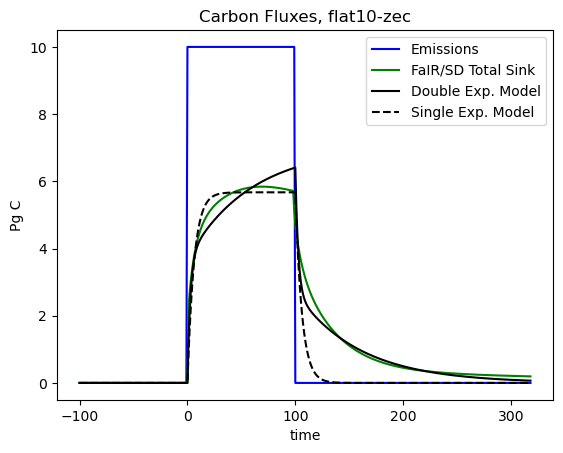

In [554]:
pred_totalsink_2timescale_zec = memory_2timescale(emiss_zec, params_combined_2timescale[0], params_combined_2timescale[1], params_combined_2timescale[2], params_combined_2timescale[3])

plt.plot(time_zec, emiss_zec, color='blue')
plt.plot(time_zec, oceansink_zec+landsink_zec, color='green')
plt.plot(time_zec, pred_totalsink_2timescale_zec, color='black')
plt.plot(time_zec, pred_totalsink_zec, color='black', linestyle='dashed')


plt.title('Carbon Fluxes, flat10-zec')
plt.ylabel('Pg C')
plt.xlabel('time')
plt.legend(['Emissions','FaIR/SD Total Sink','Double Exp. Model', 'Single Exp. Model'])

In [557]:
# Calculating TCRE & ZEC

In [562]:
f_yesSD.emissions.scenario

<xarray.DataArray 'scenario' (scenario: 1)>
array(['esm-flat10_zec'], dtype='<U14')
Coordinates:
  * scenario  (scenario) <U14 'esm-flat10_zec'

In [722]:
cumulative_emit = np.cumsum(f_yesSD.emissions.loc[dict(scenario = 'esm-flat10_zec', specie = 'CO2')]/cf,axis = 0,)

In [607]:
T = f_yesSD.temperature.loc[dict(scenario = 'esm-flat10_zec', layer = 0)]

In [616]:
f_yesSD.temperature.timebounds

<xarray.DataArray 'timebounds' (timebounds: 321)>
array([  0.,   1.,   2., ..., 318., 319., 320.])
Coordinates:
  * timebounds  (timebounds) float64 0.0 1.0 2.0 3.0 ... 317.0 318.0 319.0 320.0

<xarray.DataArray ()>
array(1.72843626)
Coordinates:
    timebounds  float64 100.0
    scenario    <U14 'esm-flat10_zec'
    layer       int64 0

TCRE1000 = 1.5610537671236837
TCRE1000 = 1.5726130613588647
ZEC20 = -0.01856416060531029
ZEC50 = -0.07226761823163609
ZEC100 = -0.0994629009382858


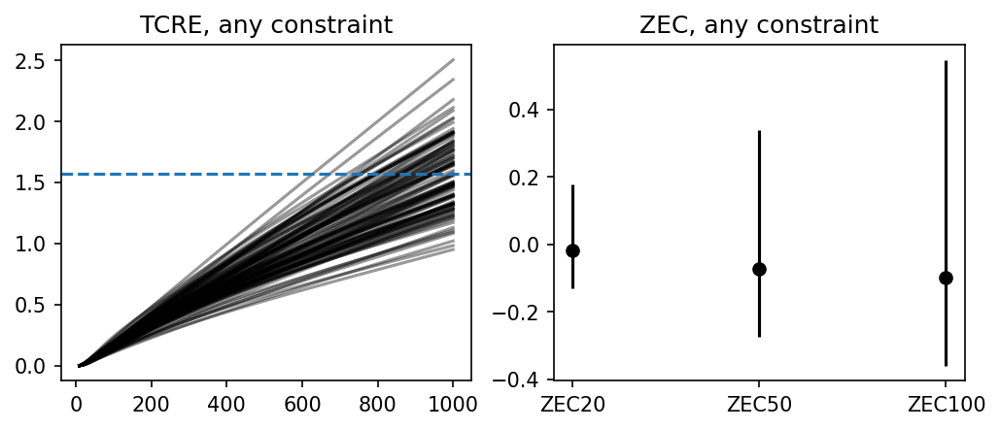

In [761]:
constraint = constrained_gems


temperature = f_yesSD.temperature.loc[dict(scenario = 'esm-flat10_zec',layer = 0,)].isel(config = constraint)                              
ZEC20 = temperature.loc[dict(timebounds = np.array([110,130]))].mean('timebounds') - temperature.loc[dict(timebounds = 100)]
ZEC50 = temperature.loc[dict(timebounds = np.array([140,160]))].mean('timebounds') - temperature.loc[dict(timebounds = 100)]
ZEC100 = temperature.loc[dict(timebounds = np.array([190,210]))].mean('timebounds') - temperature.loc[dict(timebounds = 100)]
y_error_ZEC20 = [[np.mean(ZEC20)-np.min(ZEC20)], [np.max(ZEC20)-np.mean(ZEC20)]]
y_error_ZEC50 = [[np.mean(ZEC50)-np.min(ZEC50)], [np.max(ZEC50)-np.mean(ZEC50)]]
y_error_ZEC100 = [[np.mean(ZEC100)-np.min(ZEC100)], [np.max(ZEC100)-np.mean(ZEC100)]]
slope = stats.linregress(x = np.mean(cum_emit[:100, constraint],1),y=np.mean(T[:100, constraint],1))[0]

fig, ax = plt.subplots(1, 2, figsize = (8,3), dpi = 150, sharey = False)

ax[0].plot(cumulative_emit[:100, constraint], T[:100, constraint], color = 'k', alpha = 0.4)

# ax[1].scatter('ZEC20', ZEC20.mean())

ax[1].errorbar('ZEC20', y = np.mean(ZEC20),yerr=y_error_ZEC20, fmt='o', color = 'k')  
ax[1].errorbar('ZEC50', y = np.mean(ZEC50),yerr=y_error_ZEC50, fmt='o', color = 'k')
ax[1].errorbar('ZEC100', y = np.mean(ZEC100),yerr=y_error_ZEC100, fmt='o', color = 'k')  

ax[0].set_title('TCRE, any constraint')
ax[1].set_title('ZEC, any constraint')
ax[0].set_xlabel = 'cumulative emissions [Pg C]'
ax[0].set_ylabel = 'dT [K]'
ax[0].axhline(temperature[100].mean("config").values, ls = 'dashed')
# TCRE = stats.linregress(x = cum_emit[:100, constraint],y=T[:100, constraint])
print(f'TCRE1000 = {slope*1000}')
print(f'TCRE1000 = {temperature[100].mean("config").values}')

print(f'ZEC20 = {ZEC20.values.mean()}')
print(f'ZEC50 = {ZEC50.values.mean()}')
print(f'ZEC100 = {ZEC100.values.mean()}')

In [807]:
cumulative_emit_fair = np.cumsum(f_nonSD.emissions[:100].loc[dict(specie = 'CO2', scenario = 'esm-flat10_zec')], axis = 0)
T_fair = f_nonSD.temperature[:100].loc[dict(scenario = 'esm-flat10_zec', layer = 0)]

In [820]:
temperature_nonSD
ZEC20_nonSD = temperature_nonSD[110:131,:].mean('timebounds') - temperature_nonSD[100,:]
ZEC20_nonSD

<xarray.DataArray (config: 200)>
array([1.78095875, 1.08204545, 2.65495996, 2.78586619, 1.827704  ,
       1.8419317 , 2.00145864, 2.12873259, 1.73360262, 1.34104935,
       1.80815353, 1.2810524 , 1.52456748, 1.69339053, 2.17564534,
       2.04259233, 1.16027889, 1.8809505 , 1.27903322, 1.32362405,
       1.02481265, 1.53947571, 1.49579703, 1.70748796, 1.65535406,
       2.11290004, 1.2473089 , 1.8547333 , 1.41803471, 1.32592372,
       1.23281987, 1.78173461, 1.10335032, 1.31888862, 1.6299391 ,
       1.34575794, 1.95760923, 1.18960459, 1.53754251, 1.50117608,
       1.8311886 , 1.40425208, 1.77385087, 1.5408885 , 1.78076185,
       1.80689904, 1.8747815 , 1.65222944, 1.07869542, 0.9207634 ,
       1.60192323, 1.46137576, 1.19637115, 1.36899328, 2.50035065,
       1.96219866, 1.33821762, 1.17066799, 2.46783709, 2.0467303 ,
       2.03900709, 1.33424615, 1.13116418, 1.61601671, 1.17984629,
       1.40159881, 1.30339969, 1.47156544, 2.05568851, 1.675957  ,
       1.75669738, 1.42983245, 1.83411844, 1.09945368, 1.77781861,
       1.87529355, 1.38642445, 1.32584456, 1.68670665, 1.63971787,
       1.18857197, 2.08291435, 2.14617594, 1.2159074 , 1.33555697,
       1.63196193, 1.30339836, 1.69884395, 1.25343321, 1.41188768,
       1.44390969, 1.75092461, 1.24099473, 1.02696924, 1.38829923,
       1.46635533, 1.73169664, 1.65767032, 2.0146587 , 2.17580162,
       2.04974778, 1.32547355, 1.17233653, 1.58371679, 2.1728075 ,
       1.08510245, 0.96149939, 1.91110291, 1.4087977 , 1.45132191,
       2.18119962, 1.17852743, 2.17318351, 1.76329733, 1.95330105,
       1.47281928, 1.99166314, 1.83940058, 1.4833194 , 1.37950644,
       1.55716242, 1.72238029, 1.45802823, 1.38189059, 2.35941306,
       1.80112115, 2.49714341, 1.39160001, 1.3226752 , 1.23169255,
       1.36398052, 1.5419732 , 1.61784627, 1.40344449, 1.81399263,
       2.92960254, 1.23428452, 1.30357913, 1.23043087, 1.34629206,
       1.4145603 , 1.53739794, 1.41673022, 1.77563333, 1.26954264,
       1.34572577, 1.08792933, 1.28180075, 1.53941786, 1.34686849,
       2.01182257, 1.24981309, 1.71613941, 1.97307489, 1.54053056,
       2.13085048, 2.10831836, 1.1696185 , 2.19954528, 1.22554383,
       1.60411568, 1.00043768, 1.18152799, 1.36236864, 2.04880027,
       1.50473645, 2.05742929, 1.77795702, 1.26314672, 1.65623462,
       1.72895751, 1.47559285, 1.28204415, 1.33428338, 1.94003716,
       1.4729795 , 1.20308082, 1.525627  , 1.55158432, 1.65597233,
       2.1078373 , 1.41361603, 1.32325651, 1.27241449, 1.41114782,
       1.51495813, 1.2524411 , 1.34534924, 1.83091276, 1.49482761,
       1.86511341, 1.2076034 , 1.98314869, 2.31227296, 1.36247409,
       1.52323912, 1.56766924, 1.80139136, 1.63352856, 1.18126105])
Coordinates:
    scenario  <U14 'esm-flat10_zec'
  * config    (config) int64 1230 1715 2658 3898 ... 296477 297672 298383 299646
    layer     int64 0

FaIR/SD:
TCRE1000 = 1.684924115371643
TCRE1000 = 1.6907727839827609
ZEC20 = -0.005859107655326669
ZEC50 = -0.05461362117582012
ZEC100 = -0.0843731589551351
FaIR (default):
TCRE1000 = 0.43033772823723454
TCRE1000 = 1.5766358964412086
ZEC20 = 0.016744900501790977
ZEC50 = 0.012272646903261228
ZEC100 = 0.014446575859789604


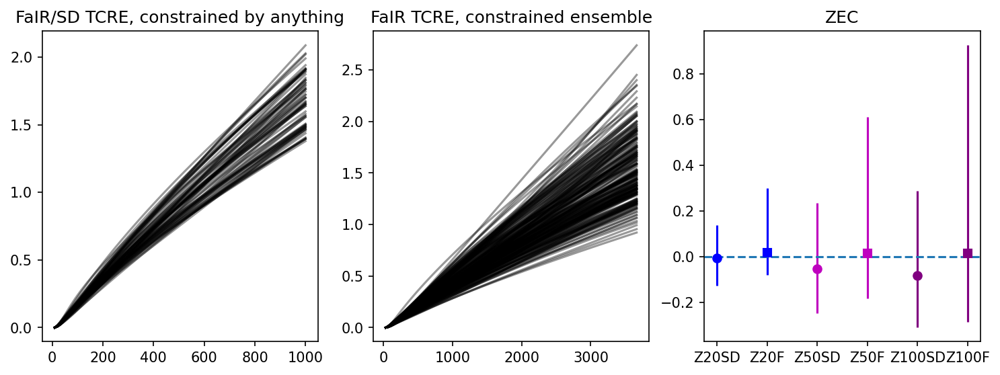

In [834]:
constraint = constrained_by_T


temperature = f_yesSD.temperature.loc[dict(scenario = 'esm-flat10_zec',layer = 0,)].isel(config = constraint)                              
ZEC20 = temperature.loc[dict(timebounds = np.array([110,130]))].mean('timebounds') - temperature.loc[dict(timebounds = 100)]
ZEC50 = temperature.loc[dict(timebounds = np.array([140,160]))].mean('timebounds') - temperature.loc[dict(timebounds = 100)]
ZEC100 = temperature.loc[dict(timebounds = np.array([190,210]))].mean('timebounds') - temperature.loc[dict(timebounds = 100)]
y_error_ZEC20 = [[np.mean(ZEC20)-np.min(ZEC20)], [np.max(ZEC20)-np.mean(ZEC20)]]
y_error_ZEC50 = [[np.mean(ZEC50)-np.min(ZEC50)], [np.max(ZEC50)-np.mean(ZEC50)]]
y_error_ZEC100 = [[np.mean(ZEC100)-np.min(ZEC100)], [np.max(ZEC100)-np.mean(ZEC100)]]
slope = stats.linregress(x = np.mean(cum_emit[:100, constraint],1),y=np.mean(T[:100, constraint],1))[0]

temperature_nonSD = f_nonSD.temperature.loc[dict(scenario = 'esm-flat10_zec',layer = 0,)]
ZEC20_nonSD = temperature_nonSD.loc[dict(timebounds = np.array([110,130]))].mean('timebounds') - temperature_nonSD.loc[dict(timebounds = 100)]
ZEC50_nonSD = temperature_nonSD.loc[dict(timebounds = np.array([140,160]))].mean('timebounds') - temperature_nonSD.loc[dict(timebounds = 100)]
ZEC100_nonSD = temperature_nonSD.loc[dict(timebounds = np.array([190,210]))].mean('timebounds') - temperature_nonSD.loc[dict(timebounds = 100)]

y_error_ZEC20_nonSD = [[np.mean(ZEC20_nonSD)-np.min(ZEC20_nonSD)], [np.max(ZEC20_nonSD)-np.mean(ZEC20_nonSD)]]
y_error_ZEC50_nonSD = [[np.mean(ZEC50_nonSD)-np.min(ZEC50_nonSD)], [np.max(ZEC50_nonSD)-np.mean(ZEC50_nonSD)]]
y_error_ZEC100_nonSD = [[np.mean(ZEC100_nonSD)-np.min(ZEC100_nonSD)], [np.max(ZEC100_nonSD)-np.mean(ZEC100_nonSD)]]
slope_nonSD = stats.linregress(x = np.mean(cumulative_emit_fair[:100, :],1),y=np.mean(T_fair[:100,:],1))[0]

fig, ax = plt.subplots(1, 3, figsize = (12,4), dpi = 150, sharey = False)

ax[0].plot(cumulative_emit[:100, constraint], T[:100, constraint], color = 'k', alpha = 0.4)

ax[1].plot(cumulative_emit_fair, T_fair, color = 'k', alpha = 0.4)

ax[2].errorbar('Z20SD', y = np.mean(ZEC20),yerr=y_error_ZEC20, fmt='o', label = 'FaIR/SD', color = 'b')  
ax[2].errorbar('Z20F', y = np.mean(ZEC20_nonSD),yerr=y_error_ZEC20_nonSD, fmt='s', label = 'FaIR', color = 'b')  
ax[2].errorbar('Z50SD', y = np.mean(ZEC50),yerr=y_error_ZEC50, fmt='o', color = 'm')
ax[2].errorbar('Z50F', y = np.mean(ZEC50_nonSD),yerr=y_error_ZEC50_nonSD, fmt='s', label = 'FaIR', color = 'm')  
ax[2].errorbar('Z100SD', y = np.mean(ZEC100),yerr=y_error_ZEC100, fmt='o', color = 'purple')
ax[2].errorbar('Z100F', y = np.mean(ZEC100_nonSD),yerr=y_error_ZEC100_nonSD, fmt='s', label = 'FaIR', color = 'purple')  

ax[0].set_title('FaIR/SD TCRE, constrained by anything')
ax[1].set_title('FaIR TCRE, constrained ensemble')
ax[2].set_title('ZEC')
ax[0].set_xlabel = 'cumulative emissions [Pg C]'
ax[0].set_ylabel = 'dT [K]'
ax[2].axhline(0, ls = 'dashed')

# TCRE = stats.linregress(x = cum_emit[:100, constraint],y=T[:100, constraint])
print('FaIR/SD:')
print(f'TCRE1000 = {slope*1000}')
print(f'TCRE1000 = {temperature[100].mean("config").values}')
print(f'ZEC20 = {ZEC20.values.mean()}')
print(f'ZEC50 = {ZEC50.values.mean()}')
print(f'ZEC100 = {ZEC100.values.mean()}')


print('FaIR (default):')
print(f'TCRE1000 = {slope_nonSD*1000}')
print(f'TCRE1000 = {temperature_nonSD[100].mean("config").values}')
print(f'ZEC20 = {ZEC20_nonSD.values.mean()}')
print(f'ZEC50 = {ZEC50_nonSD.values.mean()}')
print(f'ZEC100 = {ZEC100_nonSD.values.mean()}')


/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_59063/2938418962.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = plt.colorbar(scalar_map)


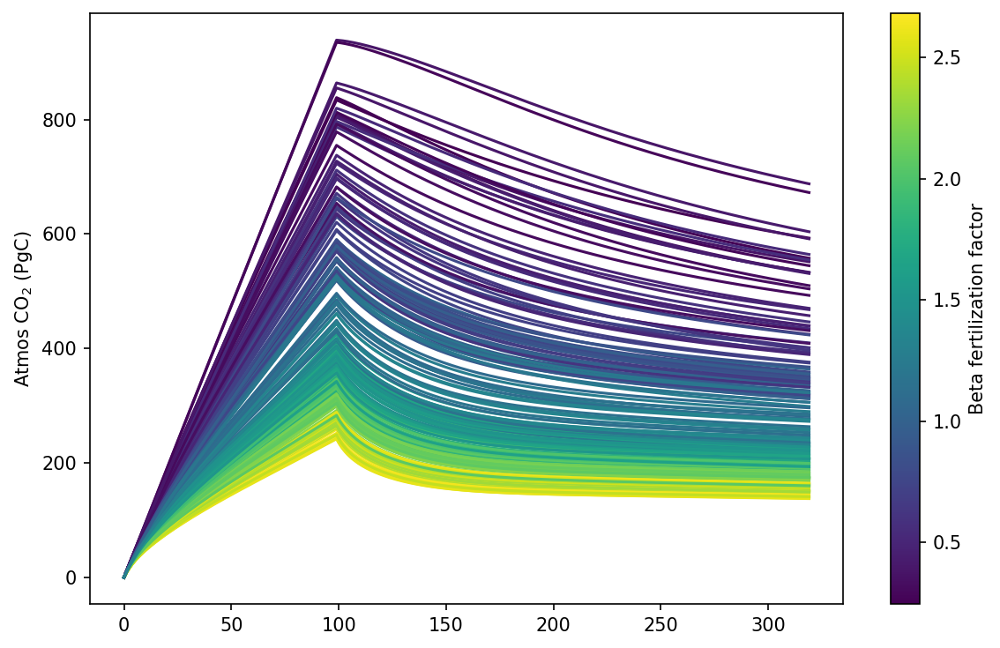

In [77]:
# color by beta_fert (not beta_550)

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig = plt.figure(figsize=(8, 5),dpi = 150)
norm = Normalize(vmin=beta550_to_betafert(beta_550_bounds[0]), vmax=beta550_to_betafert(beta_550_bounds[1]))
scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)

for i in range(len(f_yesSD.configs)):
#     param = beta550_to_betafert(config_ens[i][0])
    param = beta550_to_betafert(f_yesSD.carbon_configs.gems_beta_550.data)[i]
#     C_atm = parameters_dataset.data_vars[f'ensemble_{i}'].sel(pools='C_atm')[5000:] * PE['ma'] * 12e-15 #/ 2.12
    C_atm = dCatm_yesSD.isel(config = i)
#     if np.round(C_atm[170],2) == np.round(C_atm[100],2):
#         print(config_ens[i])
#         pass
#     else:
    plt.plot(C_atm[1:],
             color=scalar_map.to_rgba(param),
             label='_%s' % np.round(param, 2))

# Create colorbar
cb = plt.colorbar(scalar_map)
cb.set_label('Beta fertilization factor')

# plt.legend()
plt.ylabel(r'Atmos CO$_2$ (PgC)')
plt.tight_layout()
plt.show()
plt.close()

# fpath = '../../../Decarbonization/Simple_MIP/FaIR_Swann/'
# fname = 'SD_PPE_beta_fert_flat10_zec_PgC'
# # save the plot
# fig.savefig(ffname +'.png', bbox_inches='tight')
# print('done saving file')

# show the plot:
plt.show()
plt.close()


In [ ]:
beta550_to_betafert(f_yesSD.carbon_configs.gems_beta_550.data)
beta550_to_betafert(1.226)

In [ ]:

# color by beta_fert (not beta_550)

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize

norm = Normalize(vmin=beta550_to_betafert(beta_550_bounds[0]), vmax=beta550_to_betafert(beta_550_bounds[1]))
scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)

fig, ax = plt.subplots(2, 2, figsize = (12,8),dpi = 150)
for i in range(f_defSD._n_configs):
    param_defSD = beta550_to_betafert(f_defSD.carbon_configs.gems_beta_550.data)[i]
    ax[0,0].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec",config = f_defSD.configs[i])],
                 color=scalar_map.to_rgba(param_defSD),
                 alpha=0.9,
                 label='_%s' % np.round(param_defSD, 2));
    ax[0,1].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec",config = f_defSD.configs[i])],
                 color=scalar_map.to_rgba(param_defSD),
                 alpha=0.9,
                label='%s' % np.round(param_defSD, 2));
    param_yesSD = beta550_to_betafert(f_yesSD.carbon_configs.gems_beta_550.data)[i]
    ax[1,0].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec",config = f_yesSD.configs[i])],
                 color=scalar_map.to_rgba(param_yesSD),
                 alpha=0.9,
                 label='_%s' % np.round(param_yesSD, 2));
    ax[1,1].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec",config = f_yesSD.configs[i])],
                 color=scalar_map.to_rgba(param_yesSD),
                 alpha=0.9,
                label='%s' % np.round(param_yesSD, 2));

    
# plot means
ax[0,0].plot(f_defSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), lw = 5, color='m', alpha=0.7);
ax[0,1].plot(f_defSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'),lw = 5,  color='m', alpha=0.7);

ax[1,0].plot(f_yesSD.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")].mean('config'), lw = 5, color='m', alpha=0.7);
ax[1,1].plot(f_yesSD.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")].mean('config'), lw = 5, color='m', alpha=0.7);

ax[0,0].set_title('atm CO2 concentration [ppm]')
ax[0,1].set_title('change in surface T [K]')

ax[0,0].set_ylabel('default SD CC params')
ax[1,0].set_ylabel('modified SD CC params')

ax[0,0].set_ylim([280,475])
ax[1,0].set_ylim([280,475])
ax[0,1].set_ylim([-.1,2.3])
ax[1,1].set_ylim([-.1,2.3])

# Create colorbar axis
cax = fig.add_axes([0.93, 0.1, 0.02, 0.8])  # [left, bottom, width, height]
cb = plt.colorbar(scalar_map, cax=cax)
cb.set_label('Beta fertilization factor')

# plt.tight_layout()
ax[0,1].legend(bbox_to_anchor =(1.5,1))
ax[1,1].legend(bbox_to_anchor =(1.5,1))
plt.show()

In [ ]:
from collections import OrderedDict

# new ordered dict for results 
res = OrderedDict()

# swap x and y axes of solution array 
y_swap = f.co2_partitions[:,0,:,0,:]

res['tmp'] = y_swap[:,:][:, :, PE['Jtmp']].transpose()
res['nut'] = y_swap[:,:][:, :, PE['Jnut']].transpose()
res['coc'] = y_swap[:,:][:, :, PE['Jcoc']].transpose()
res['cla'] = y_swap[:,:][:, :, PE['Jcla']].transpose() * PL['Ala']
res['atm'] = y_swap[:,:][:, :, PE['Jatm']].transpose()

# combined land pools
res['veg'] = np.sum(res['cla'][np.array([PL['iLeaf'], PL['iRoot'], PL['iWood']]), :],0) # vegetation: leaf + root + wood
res['lit'] = np.sum(res['cla'][np.array([PL['iLit1'], PL['iLit2']]),:],0) # litter: metabolic + structural
res['cwd'] = np.sum(res['cla'][np.array([PL['iCWDC']]),:],0) # coarse woody debris
res['som'] = np.sum(res['cla'][np.array([PL['iSOM1'], PL['iSOM2'], PL['iSOM3']]),:],0) # soil organic matter (active+slow+passive)

# Psi=Psi./repmat(V',[1 PE.nb]) % divide by volume to get timescale
# Psi = Psi / np.tile(V.reshape(7, 1), (1, 7))

# net change ocn
##junk = V.coc-repmat(V.coc(:,1),[1 length(tcal)]); ## MATLAB
junk = res['coc'] - res['coc'][0,...] # subtract the first time point to get a difference time series

##dCoc = sum(junk.*repmat(PO.V',[1 length(tcal)]))*12e-15; ## MATLAB
# dCoc = np.sum(junk*np.tile(PO['V'],(np.size(f.timebounds),1)).transpose(),0)*12e-15 # multiply by the volume of the ocean in each box, then sum
for i in range(7):
    ocean = np.empty_like(junk)
    ocean[i,:,:] = junk[i,:,:]*PO['V'][i] *12e-15
dCoc = np.sum(ocean,0)
# net change land
junk = np.sum(res['cla'], 0)
#if PS['DoTer'] == 1:
#    dCla = (junk - junk[1]) * 12e-15
#    res['dCla'] = dCla
dCla = (junk - junk[1]) * 12e-15


# net change atm
dCatm = (res['atm'] - PE['patm0']) * PE['ma'] * 12e-15

# store in dictionary
res['dCla'] = dCla
res['dCoc'] = dCoc
res['dCatm'] = dCatm

In [ ]:
plt.plot(dCoc)

In [ ]:
# ocean_carbon = ((f.co2_partitions[:,0,:,0,7:14]*PO['V']).sum('gasbox') + (f.co2_partitions[:,0,:,0,14:21]*PO['V']).sum('gasbox'))*12e-15
##dCoc = sum(junk.*repmat(PO.V',[1 length(tcal)]))*12e-15; ## MATLAB
# dCoc = np.sum(junk*np.tile(PO['V'],(np.size(tcal),1)).transpose(),0)*12e-15 # multiply by the volume of the ocean in each box, then sum


In [ ]:
plt.plot(ocean_carbon, color = colors[0], label = 'ocean carbon')
plt.plot(land_carbon, color = colors[1], label = 'land carbon')
plt.plot(atm_carbon, color = colors[2], label = 'atm carbon')

plt.legend(bbox_to_anchor = (1,1))

In [ ]:
# constraining from historical:


In [40]:
import numpy as np
from scipy import stats

def hist_temp(Tobs, Tmodel, years, inflate=True, CI=0.9):
    """Checks to see whether model-derived temperatures fall in observational
    uncertainty.

    Uses the method of Thompson et al., 2015, also used in IPCC AR5 to derive
    temperature trends which includes autocorrelation. The regression slope of
    the observations is compared to the regression slope of the model. If the
    trend of the model is within observational uncertainty, the test passes.

    Reference: J. Climate, 28, 6443-6456 10.1175/JCLI-D-14-00830.1

    inputs:
        Tobs: observed temperature time series. Numpy array
        Tmodel: modelled temperature time series. Numpy array
        years: Numpy array of years covered by Tobs and Tmodel

    keywords:
        inflate: True (default) if the uncertainty bounds should be inflated
            for lag-1 autocorrelation - as used in Thompson.
        CI: confidence interval around the mean regression slope to count as
            constrained. Default 0.9.

    returns:
        accept: True if ensemble member agrees with observations else False.
        slope_m: regression slope of modelled temperature
        intercept_m: intercept of modelled temperature
        slope_o: regression slope of observed temperature
        intercept_o: intercept of observed temperature
    """

    n = float(len(years))

    # detrend the 1880-2016 observations and apply the internal variability
    # estimate as detailed in eq. 8 of Thompson et al, J. Climate 2015

    slope_o, intercept_o, _, _, stderr_o = stats.linregress(years,Tobs)
    resid = slope_o * years + intercept_o - Tobs
    s = np.std(resid, ddof=2)
    if inflate:
        lag1ac = np.corrcoef(resid[:-1],resid[1:])[1,0]
    else:
        lag1ac = 0
    gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
    g = np.sqrt(12./(n**3 - n))
    tcrit = stats.t.ppf(1-(1-CI)/2.0, df=n)
    CI_o = s * gamma * tcrit * g

    # check modelled T against observed
    slope_m,intercept_m,_,_,stderr_m = stats.linregress(years, Tmodel)

    if slope_o-CI_o <= slope_m <= slope_o+CI_o:
        accept = True
    else:
        accept = False
    return accept, slope_m, intercept_m, slope_o, intercept_o

In [41]:
# constraining from historical:
ml_file = os.path.join("fair_local", "defaults", "data", "emissions", "co2_annmean_mlo.csv")
maunaloa = pd.read_csv(ml_file, skiprows = 43)
ml=xr.DataArray(maunaloa['mean'], coords = {'time': maunaloa['year']})

gl_file = os.path.join("fair_local", "defaults", "data", "obs", "co2_annmean_gl.csv")
glgr_file = os.path.join("fair_local", "defaults", "data", "obs", "co2_gr_gl.csv")
co2_annmean_gl = pd.read_csv(gl_file, skiprows = 37)
co2_gr_gl = pd.read_csv(glgr_file, skiprows = 43)
gl = xr.DataArray(co2_annmean_gl['mean'], coords = {'time': co2_annmean_gl['year']})
gl_unc = xr.DataArray(co2_annmean_gl['unc'], coords = {'time': co2_annmean_gl['year']})
gr = xr.DataArray(co2_gr_gl['ann inc'], coords = {'time': co2_gr_gl['year']})
gr_unc = xr.DataArray(co2_gr_gl['unc'], coords = {'time': co2_gr_gl['year']})

In [42]:
co2_constraint = gl_unc.sum('time')*10
co2_constraint

<xarray.DataArray 'unc' ()>
array(28.3)

In [43]:
c_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2')]
ens = c_atm.sel(timebounds = slice(gl_unc.time[0].values - 1850, gl_unc.time[-1].values-1850)).isel(config = 0)

temp = (ens.values-gl.values)
np.sum(temp)

-589.221215127307

In [44]:
config_ens = f_gcbSD.configs

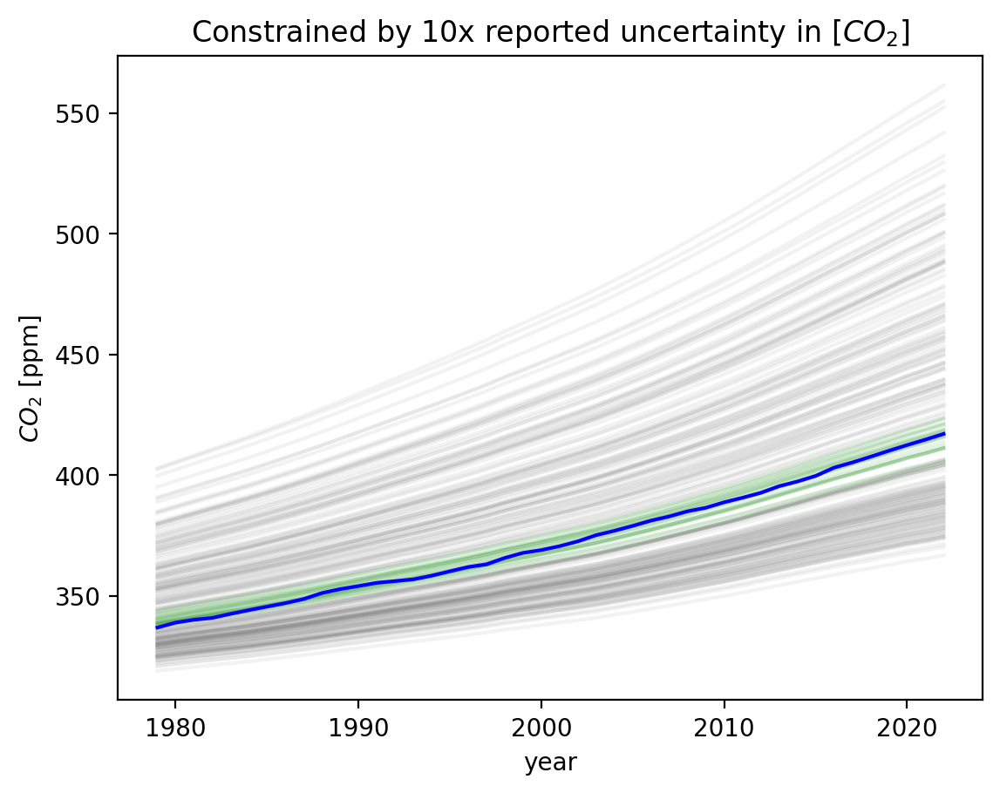

In [45]:
plt.figure(dpi = 200)

co2_constraint = gl_unc[:-1].sum('time')*100
c_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2')]

constrained_by_co2 = []

for i in range(len(config_ens)):
    ens = c_atm.sel(timebounds = slice(gl_unc.time[0].values - 1850, gl_unc.time[-2].values-1850)).isel(config = i)
    ens_resid = np.abs(ens.values-gl[:-1].values)
    if np.sum(ens_resid) < co2_constraint:
        constrained_by_co2.append(config_ens[i])
        plt.plot(gl_unc.time[:-1], ens, c = 'g', alpha = 0.1)
    else:
        pass
        plt.plot(gl_unc.time[:-1], ens, c = 'grey', alpha = 0.1)
plt.plot(gl_unc.time[:-1], gl[:-1], c = 'b', alpha = 1)

plt.xlabel('year')
plt.ylabel(r'$CO_{2}$ [ppm]')
plt.title('Constrained by 10x reported uncertainty in [$CO_2$]')
plt.show();plt.close()

In [331]:
constrained_by_gr == constrained_by_co2

False

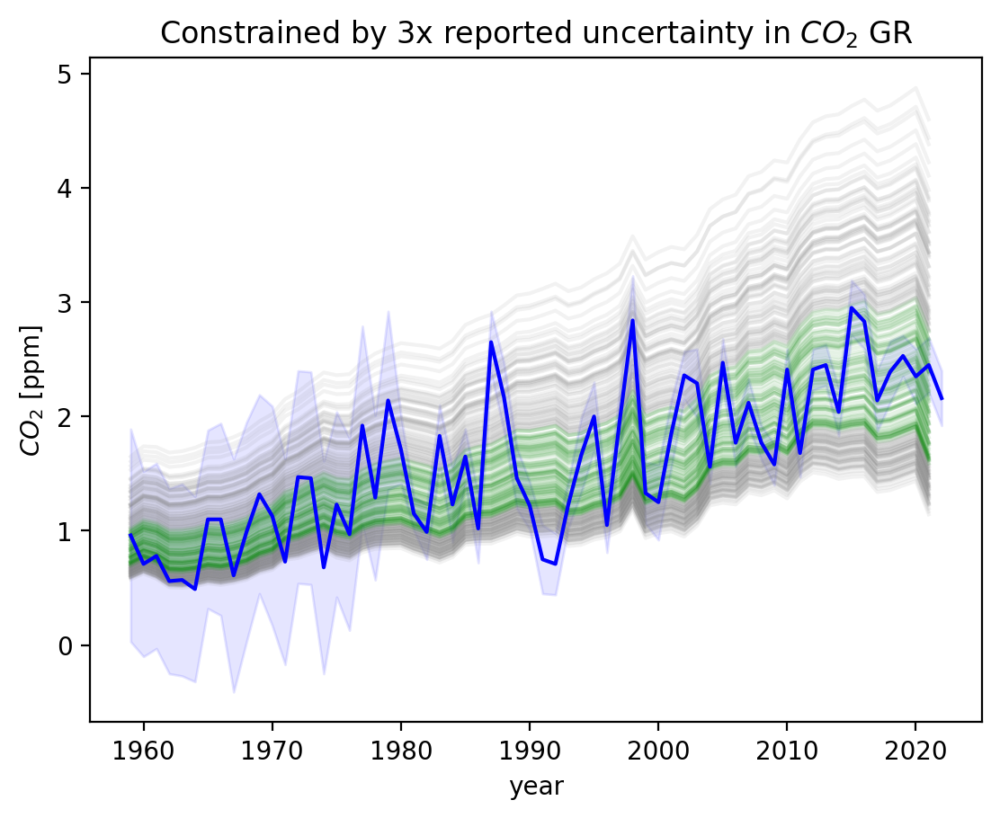

In [46]:
plt.figure(dpi = 200)

blast = 3
gr_constraint = gr_unc[:-1].sum('time')*blast


constrained_by_gr = []
for i in range(len(config_ens)):
    atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2')].isel(config = i)
    gr_atm = np.diff(atm)
    da_gr_atm = xr.DataArray(gr_atm, coords = {'time' : np.arange(1851, 1851+len(gr_atm), 1)})
    ens = da_gr_atm.sel(time = gr_unc.time.values[:-1])
    ens_resid = np.abs(ens.values-gr[:-1].values)

    if np.sum(ens_resid) < gr_constraint:
        constrained_by_gr.append(config_ens[i])
        plt.plot(gr_unc.time.values[:-1], ens, c = 'g', alpha = 0.1)
    else:
        pass
        plt.plot(gr_unc.time.values[:-1], ens, c = 'grey', alpha = 0.1)
plt.plot(gr.time, gr, c = 'b', alpha = 1)
plt.fill_between(gr.time, gr+blast*gr_unc, gr-blast*gr_unc, color = 'b', alpha = 0.1)

# plt.xlim([gr_unc.time.values[0],gr_unc.time.values[-1]])
plt.xlabel('year')
plt.ylabel(r'$CO_{2}$ [ppm]')
plt.title(f'Constrained by {blast}x reported uncertainty in $CO_2$ GR')
plt.show();plt.close()

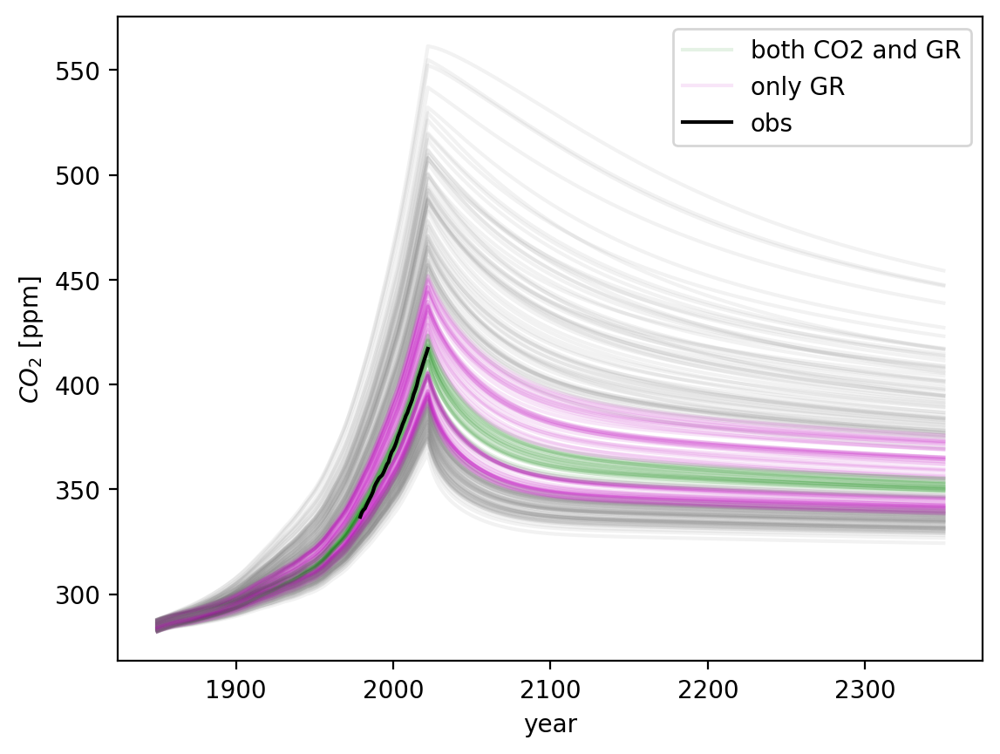

In [47]:
plt.figure(dpi = 200)

blast = 3
gr_constraint = gr_unc[:-1].sum('time')*blast

for config in config_ens:
    atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2')].sel(config = config)
    if config in constrained_by_co2:
        if config in constrained_by_gr:
            p1 = plt.plot(atm.timebounds+1850, atm, c = 'g', alpha = 0.1, label = 'both CO2 and GR')
        else:
            print('anything?')
            p2 = plt.plot(atm.timebounds+1850, atm, c = 'b', alpha = 0.1, label = 'only CO2')
    elif config in constrained_by_gr: #and not constrained_by_co2:
        p3 = plt.plot(atm.timebounds+1850, atm, c = 'm', alpha = 0.1, label = 'only GR')
    else:
        plt.plot(atm.timebounds+1850, atm, c = 'grey', alpha = 0.1, label = '_all members')
p4 = plt.plot(gl.time[:-1], gl[:-1], c = 'k', alpha = 1, label = 'obs')
plt.legend(handles = [p1[0], 
#                       p2[0], 
                      p3[0], p4[0]])
plt.xlabel('year')
plt.ylabel(r'$CO_{2}$ [ppm]')
# plt.title(f'Constrained by {blast}x reported uncertainty in $CO_2$ GR')
plt.show();plt.close()

In [48]:
# Constrain with Temperature

In [49]:
T = f_gcbSD.temperature.loc[dict(scenario = 'hist_gcb', layer = 0)]

In [50]:
# Cowtan & Way in-filled dataset of global temperatures
CW = np.loadtxt('fair_local/defaults/data/obs/had4_krig_annual_v2_0_0.csv')
constrained = np.zeros(200, dtype=bool)

CW[:,0]
for i in range(200):
    # we use observed trend from 1880 to 2020
    constrained[i],_,_,_,_ = hist_temp(
        CW[30:,1], T[1880-1850:2021-1850,i], CW[30:,0])

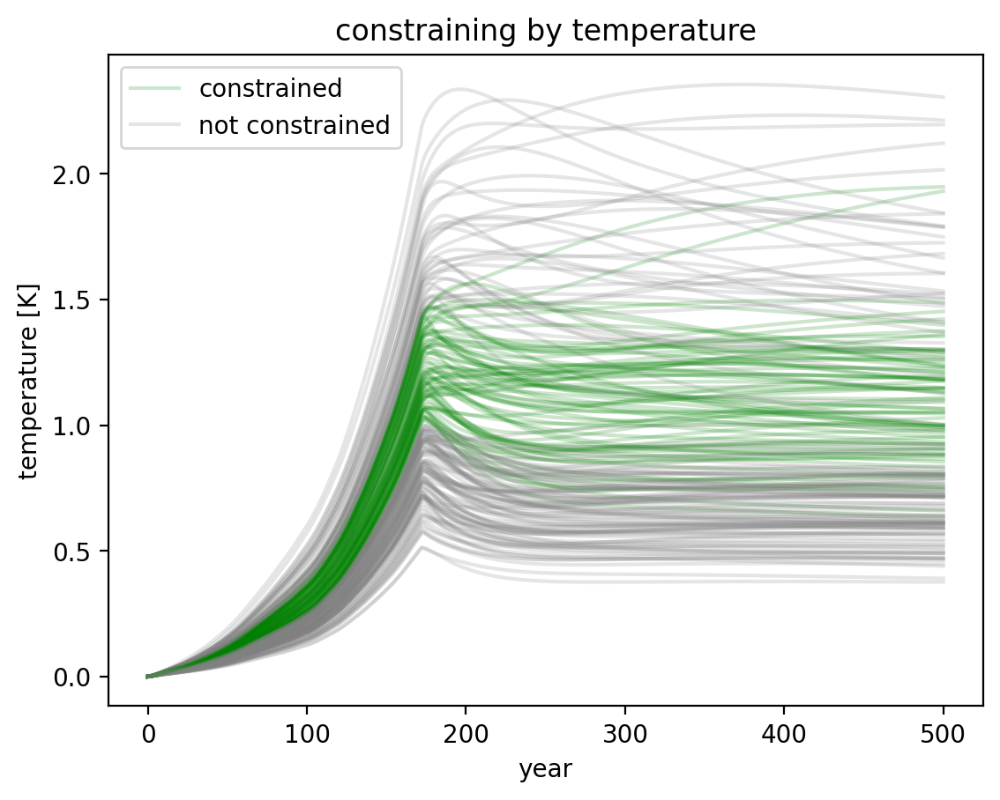

In [51]:
plt.figure(dpi = 200)
for i in range(200):
    if constrained[i]:
        p1 = plt.plot(T[:,i], c = 'g', alpha = 0.2, label = 'constrained')
    else:
        p2 = plt.plot(T[:,i], c = 'grey', alpha = 0.2, label = 'not constrained')
plt.legend(handles = [p1[0], p2[0]])
plt.title('constraining by temperature')
plt.ylabel('temperature [K]')
plt.xlabel('year')
plt.show()
plt.close()

In [142]:
constrained_by_T = []
for i in range(200):
    if constrained[i]:
        constrained_by_T.append(config_ens[i])
constrained_by_T
constrained_by_gr
constrained_by_co2

constrained_gems = []
for i in range(200):
    if config_ens[i] in constrained_by_T:
        constrained_gems.append(config_ens[i])
    elif config_ens[i] in constrained_by_gr:
        constrained_gems.append(config_ens[i])
    elif config_ens[i] in constrained_by_co2:
        constrained_gems.append(config_ens[i])
    else:
        pass
len(constrained_gems)

121

In [349]:

# Save the array to a binary files
import datetime
    
file_name = f'constrained_gems_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
np.save(file_name, constrained_gems)

file_name = f'constrained_by_gr_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
np.save(file_name, constrained_by_gr)

file_name = f'constrained_by_co2_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
np.save(file_name, constrained_by_co2)

file_name = f'constrained_by_T_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
np.save(file_name, constrained_by_T)


# # Load the saved array
# file_name = f'constrained_gems{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
# arr_loaded = np.load(file_name)
# print(arr_loaded)

# # config_ens = arr_loaded

[  1715   3898   7996   8383   9214   9680  12349  13729  14515  15186
  16767  17371  17813  23544  23590  28108  28578  30306  37027  41372
  43444  48679  51558  58814  61215  62962  66380  67109  74805  82942
  84839  90101  92941  94283  95889 103238 104018 104455 105860 107761
 111839 113632 114151 116975 123643 127438 128300 130510 131918 137878
 142057 145129 146882 150552 155878 163241 163559 166241 169318 172490
 177693 190510 190811 192403 194039 207769 210600 212348 212504 212887
 213081 217600 217680 220966 229290 230508 231348 234533 236168 240012
 243453 252049 253983 255460 260945 262404 266399 267598 270339 274614
 278796 281036 282915 283722 284556 286794 287872 291399 294331 295377
 295888 296233 296477 297672 298383 299646]


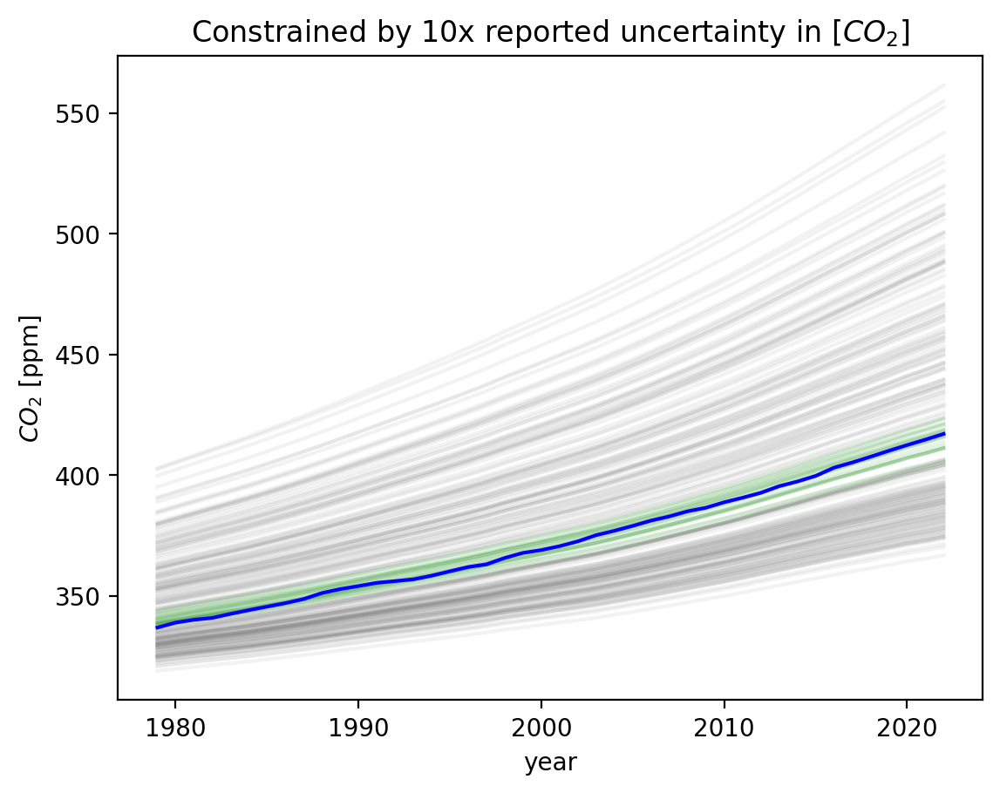

In [53]:
plt.figure(dpi = 200)

co2_constraint = gl_unc[:-1].sum('time')*100
c_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2')]

constrained_by_co2 = []

for i in range(len(config_ens)):
    ens = c_atm.sel(timebounds = slice(gl_unc.time[0].values - 1850, gl_unc.time[-2].values-1850)).isel(config = i)
    ens_resid = np.abs(ens.values-gl[:-1].values)
    if np.sum(ens_resid) < co2_constraint:
        constrained_by_co2.append(config_ens[i])
        plt.plot(gl_unc.time[:-1], ens, c = 'g', alpha = 0.1)
    else:
        pass
        plt.plot(gl_unc.time[:-1], ens, c = 'grey', alpha = 0.1)
plt.plot(gl_unc.time[:-1], gl[:-1], c = 'b', alpha = 1)

plt.xlabel('year')
plt.ylabel(r'$CO_{2}$ [ppm]')
plt.title('Constrained by 10x reported uncertainty in [$CO_2$]')
plt.show();plt.close()

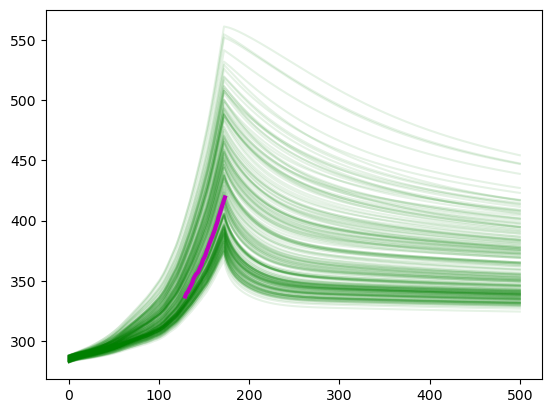

In [54]:
plt.plot(f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2')],alpha = 0.1, c = 'g')

plt.plot(np.arange(gl.time[0].values-1850, gl.time[0].values-1850+len(gl)),gl, color = 'm', lw = 3)

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_4343/1445458550.py:33: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = plt.colorbar(scalar_map)


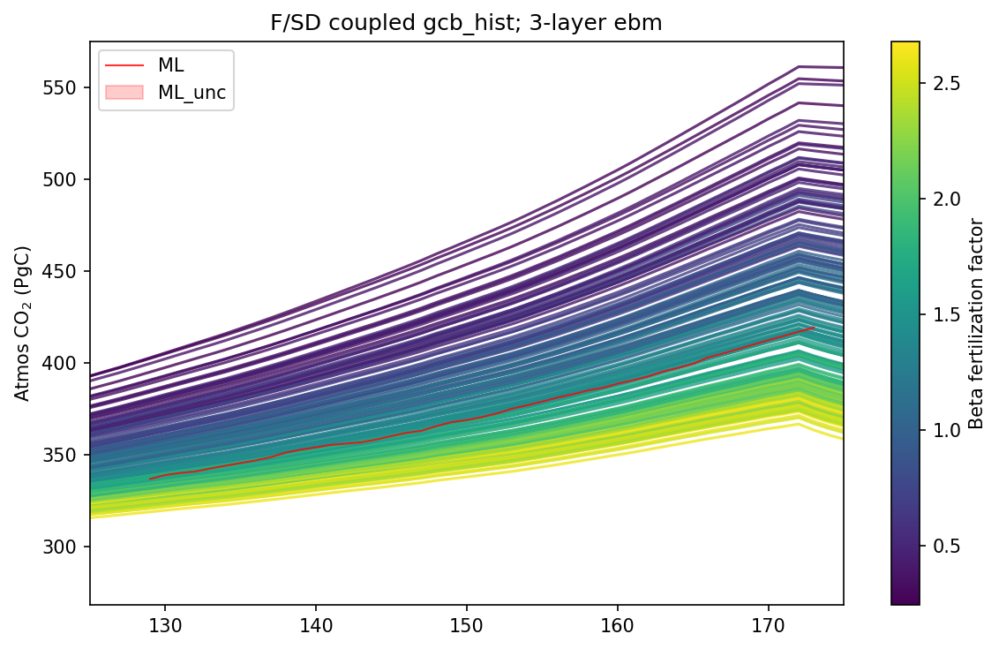

In [65]:
# color by beta_fert (not beta_550)

blast = 10 #by how much do you want to blast open the standard deviation

import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize

fig = plt.figure(figsize=(8, 5),dpi = 150)


norm = Normalize(vmin=beta550_to_betafert(beta_550_bounds[0]), vmax=beta550_to_betafert(beta_550_bounds[1]))
scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)

for i in range(len(config_ens)):
#     param = beta550_to_betafert(config_ens[i][0])
    param = beta550_to_betafert(f_gcbSD.carbon_configs.gems_beta_550.data)[i]
#     C_atm = parameters_dataset.data_vars[f'ensemble_{i}'].sel(pools='C_atm')[5000:] * PE['ma'] * 12e-15 #/ 2.12
    C_atm = f_gcbSD.concentration.loc[dict(scenario = 'hist_gcb', specie = 'CO2')].isel(config = i)
#     if np.round(C_atm[170],2) == np.round(C_atm[100],2):
#         print(config_ens[i])
#         pass
#     else:
    plt.plot(C_atm,
             color=scalar_map.to_rgba(param),
             label='_%s' % np.round(param, 2), alpha = 0.8)

plt.plot(np.arange(gl.time[0].values-1850, gl.time[0].values-1850+len(gl)),gl, color = 'r', lw = 1, alpha = 0.8, label = 'ML')
plt.fill_between(np.arange(gl.time[0].values-1850, gl.time[0].values-1850+len(gl)),gl+(blast*gl_unc), gl-(blast*gl_unc), color = 'r', alpha = 0.2, label = 'ML_unc')

plt.xlim([125,175])

# Create colorbar
cb = plt.colorbar(scalar_map)
cb.set_label('Beta fertilization factor')
plt.title('F/SD coupled gcb_hist; 3-layer ebm')

plt.legend()
plt.ylabel(r'Atmos CO$_2$ (PgC)')
plt.tight_layout()
plt.show()
plt.close()

# fpath = '../../../Decarbonization/Simple_MIP/FaIR_Swann/'
# fname = 'SD_PPE_beta_fert_flat10_zec_PgC'
# # save the plot
# fig.savefig(ffname +'.png', bbox_inches='tight')
# print('done saving file')

# show the plot:
plt.show()
plt.close()


In [141]:
beta_550_bounds[1]-1

1.1

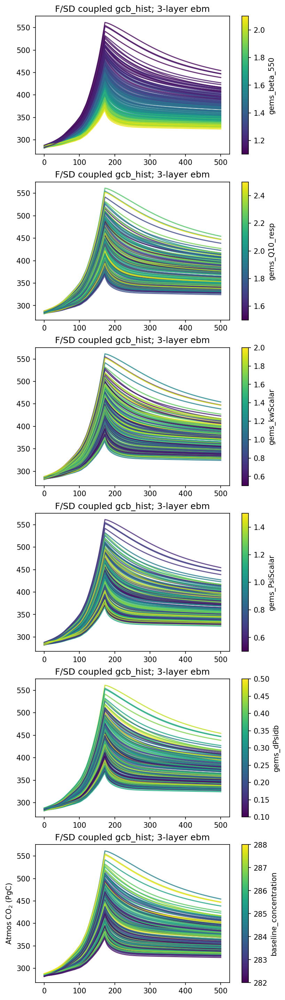

In [136]:
# color by all the parameters:

param_bound_list = [beta_550_bounds, Q10_resp_bounds, kwScalar_bounds, PsiScalar_bounds, dPsidb_bounds, 
                    patm0_bounds
                   ]
# gems_param_list = [gems_beta_550, gems_Q10_resp, gems_kwScalar, gems_PsiScalar, gems_dPsidb, gems_patm0]

fig, ax = plt.subplots(6, 1, figsize = (6,24),dpi = 150)

for i, param_bounds in enumerate(param_bound_list):
#     if param_bounds == beta_550_bounds:
#         norm = Normalize(vmin=beta550_to_betafert(beta_550_bounds[0]), vmax=beta550_to_betafert(beta_550_bounds[1]))
#         scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)
#     if:
    norm = Normalize(vmin=param_bounds[0], vmax=param_bounds[1])
    scalar_map = cm.ScalarMappable(norm=norm, cmap=cm.viridis)
    
    for j in range(len(config_ens)):
#         if param_bounds == beta_550_bounds:
#             param = beta550_to_betafert(f_gcbSD.carbon_configs.gems_beta_550.data)[j]
#             C_atm = f_gcbSD.concentration.loc[dict(scenario = 'hist_gcb', specie = 'CO2')].isel(config = j)
        if param_bounds == patm0_bounds:
            param = f_gcbSD.species_configs.baseline_concentration.loc[dict(specie = 'CO2')].data[j]
            C_atm = f_gcbSD.concentration.loc[dict(scenario = 'hist_gcb', specie = 'CO2')].isel(config = j)
        else:
            data_array = f_gcbSD.carbon_configs[list(f_gcbSD.carbon_configs.data_vars)[i]]
            param = (data_array.data)[j]
            C_atm = f_gcbSD.concentration.loc[dict(scenario = 'hist_gcb', specie = 'CO2')].isel(config = j)

        ax[i].plot(C_atm,
                 color=scalar_map.to_rgba(param),
                 label='_%s' % np.round(param, 2), alpha = 0.8, )
        
        
#         cb = ax[i].colorbar(scalar_map)
#         cb.set_label('Beta fertilization factor')
        ax[i].set_title('F/SD coupled gcb_hist; 3-layer ebm')
        plt.ylabel(r'Atmos CO$_2$ (PgC)')
    # Create colorbar
#     if param_bounds == beta_550_bounds:
#         fig.colorbar(scalar_map, ax=ax[i], label='beta fertilization factor')
    if param_bounds == patm0_bounds:
        fig.colorbar(scalar_map, ax=ax[i], label='baseline_concentration')
    else:
        fig.colorbar(scalar_map, ax=ax[i], label=f'{list(f_gcbSD.carbon_configs.data_vars)[i]}')

        

plt.show();plt.close()



In [58]:
years = maunaloa.year[:-1]
Tobs = ml[:-1]
stdev = 0.26


In [59]:
time_obs = gl.time[:-1]
obs_time = np.arange(gl.time[0].values-1850, gl.time[0].values-1850+len(gl))
# iobs_time = [obs_time[0]: obs_time[-1]]
obs = gl[:-1]
unc = gl_unc[:-1]
blast = 10

In [60]:
time_obs

<xarray.DataArray 'time' (time: 44)>
array([1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002,
       2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])
Coordinates:
  * time     (time) int64 1979 1980 1981 1982 1983 ... 2018 2019 2020 2021 2022

In [61]:
plt.figure(dpi = 200)

m = 20
for i in range(m,200):
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[ordered_ab[i][0]])]
    model = (C_atm)[obs_time[0]:obs_time[-1]]
    plt.plot(time_obs,model, 'grey', alpha = 0.05, label = f'_bottom {n} RMSE')

plt.plot(time_obs,obs, 'k',label = r'ML')
plt.fill_between(time_obs, obs +  blast*unc, obs - blast*unc,
                 alpha = 0.5, color = 'r', label = fr'ML +/- {blast}$\sigma$')
diff_sq = []
diff_ab = []
for i in range(len(config_ens)):
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[i])]
    model = (C_atm)[obs_time[0]:obs_time[-1]]
#     print(model.values)
    diff_sq.append((int(i), np.sqrt(np.sum((model.values - obs.values)**2)/len(time_obs))))
    diff_ab.append((int(i), np.sum(abs(model.values - obs.values))/len(time_obs)))


dtype = [('iparam', int),('error', float)]
a_sq = np.array(diff_sq, dtype=dtype)       # create a structured array
ordered_sq = np.sort(a_sq, order='error')

a_ab = np.array(diff_ab, dtype=dtype)       # create a structured array
ordered_ab = np.sort(a_ab, order='error')

for i in range(m):
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[ordered_sq[i][0]])]
    model = (C_atm)[obs_time[0]:obs_time[-1]]
    if i == 0:
        plt.plot(time_obs,model, 'g', alpha = 0.1, label = f'top {m} RMSE (max={np.round(ordered_sq[m-1][1],2)})')
    plt.plot(time_obs,model, 'g', alpha = 0.1, label = f'_top {m} RMSE')

for i in range(m):
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[ordered_ab[i][0]])]
    model = (C_atm)[obs_time[0]:obs_time[-1]]
    if i == 0:
        plt.plot(time_obs,model, 'm', alpha = 0.1, label = f'top {m} MAE (max={np.round(ordered_ab[m-1][1],2)})')
    plt.plot(time_obs,model, 'm', alpha = 0.1, label = f'_top {m} MAE')
    


plt.title(f'top {n} parameter combinations for FaIR-SD coupled runs \n(200 ensemble memebers)')
plt.ylabel('atmos CO2 [ppm]')
plt.legend()

NameError: name 'ordered_ab' is not defined

<Figure size 1280x960 with 0 Axes>

In [366]:

model = C_atm[years_GR[0].values-1850:years_GR[-1].values-1850+2]
GR_model = np.diff(Tmodel)
# GR_obs = np.diff(Tobs)
# GR_obs = np.diff(Tobs)
GR_obs = gr

NameError: name 'years_GR' is not defined

In [367]:
years_GR[0]-1850
GR_model = np.diff(C_atm)[108:108+64]
GR_model

NameError: name 'years_GR' is not defined

In [368]:
# https://github.com/njleach/FAIR/blob/997fb82f954a41196808ec74113207de38d4b295/fair/tools/constrain.py#L4

from __future__ import division

import numpy as np
from scipy import stats

def hist_temp(Tobs, Tmodel, years, inflate=True, CI=0.9):
    """Checks to see whether model-derived temperatures fall in observational
    uncertainty.

    Uses the method of Thompson et al., 2015, also used in IPCC AR5 to derive
    temperature trends which includes autocorrelation. The regression slope of
    the observations is compared to the regression slope of the model. If the
    trend of the model is within observational uncertainty, the test passes.

    Reference: J. Climate, 28, 6443-6456 10.1175/JCLI-D-14-00830.1

    inputs:
        Tobs: observed temperature time series. Numpy array
        Tmodel: modelled temperature time series. Numpy array
        years: Numpy array of years covered by Tobs and Tmodel

    keywords:
        inflate: True (default) if the uncertainty bounds should be inflated
            for lag-1 autocorrelation - as used in Thompson.
        CI: confidence interval around the mean regression slope to count as
            constrained. Default 0.9.

    returns:
        accept: True if ensemble member agrees with observations else False.
        slope_m: regression slope of modelled temperature
        intercept_m: intercept of modelled temperature
        slope_o: regression slope of observed temperature
        intercept_o: intercept of observed temperature
    """

    n = float(len(years))

    # detrend the 1880-2016 observations and apply the internal variability
    # estimate as detailed in eq. 8 of Thompson et al, J. Climate 2015

    slope_o, intercept_o, _, _, stderr_o = stats.linregress(years,Tobs)
    resid = slope_o * years + intercept_o - Tobs
    s = np.std(resid, ddof=2)
    if inflate:
        lag1ac = np.corrcoef(resid[:-1],resid[1:])[1,0]
    else:
        lag1ac = 0
    gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
    g = np.sqrt(12./(n**3 - n))
    tcrit = stats.t.ppf(1-(1-CI)/2.0, df=n)
    CI_o = s * gamma * tcrit * g

    # check modelled T against observed
    slope_m,intercept_m,_,_,stderr_m = stats.linregress(years, Tmodel)

    if slope_o-CI_o <= slope_m <= slope_o+CI_o:
        accept = True
    else:
        accept = False
    return accept, slope_m, intercept_m, slope_o, intercept_o

In [369]:
gl

<xarray.DataArray 'mean' (time: 45)>
array([336.85, 338.91, 340.11, 340.86, 342.53, 344.07, 345.54, 346.97,
       348.68, 351.16, 352.79, 354.06, 355.39, 356.09, 356.83, 358.33,
       360.17, 361.93, 363.05, 365.7 , 367.79, 368.96, 370.57, 372.58,
       375.14, 376.95, 378.98, 381.15, 382.9 , 385.02, 386.5 , 388.76,
       390.63, 392.65, 395.4 , 397.34, 399.65, 403.07, 405.22, 407.61,
       410.07, 412.44, 414.7 , 417.07, 419.25])
Coordinates:
  * time     (time) int64 1979 1980 1981 1982 1983 ... 2019 2020 2021 2022 2023

0 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
1 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
2 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
3 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
4 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
5 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
6 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
7 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
8 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
9 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
10 (True, 0.027775294393280227, -53.691912821154006, 0.02717

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

24 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
25 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
26 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
27 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
28 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
29 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
30 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
31 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
32 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
33 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
34 (True, 0.027775294393280227, -53.69191282115400

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

47 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
48 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
49 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
50 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
51 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
52 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
53 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
54 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
55 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
56 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
57 (True, 0.027775294393280227, -53.69191282115400

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

74 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
75 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
76 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
77 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
78 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
79 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
80 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
81 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
82 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
83 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
84 (True, 0.027775294393280227, -53.69191282115400

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

101 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
102 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
103 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
104 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
105 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
106 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
107 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
108 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
109 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
110 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
111 (True, 0.027775294393280227, -53.691

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

122 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
123 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
124 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
125 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
126 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
127 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
128 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
129 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
130 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
131 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
132 (True, 0.027775294393280227, -53.691

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

147 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
148 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
149 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
150 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
151 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
152 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
153 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
154 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
155 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
156 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
157 (True, 0.027775294393280227, -53.691

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

167 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
168 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
169 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
170 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
171 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
172 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
173 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
174 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
175 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
176 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
177 (True, 0.027775294393280227, -53.691

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

187 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
188 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
189 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
190 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
191 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
192 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
193 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
194 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
195 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
196 (True, 0.027775294393280227, -53.691912821154006, 0.027179945054945056, -52.49793063186814)
197 (True, 0.027775294393280227, -53.691

/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r42dt0j1b8bc0000gq/T/ipykernel_47981/3419663376.py:50: RuntimeWarning: invalid value encountered in sqrt
  gamma = np.sqrt( n / ((n-2) * (1-lag1ac)/(1+lag1ac) - 2 ))
/var/folders/60/rqnm7l395374r4

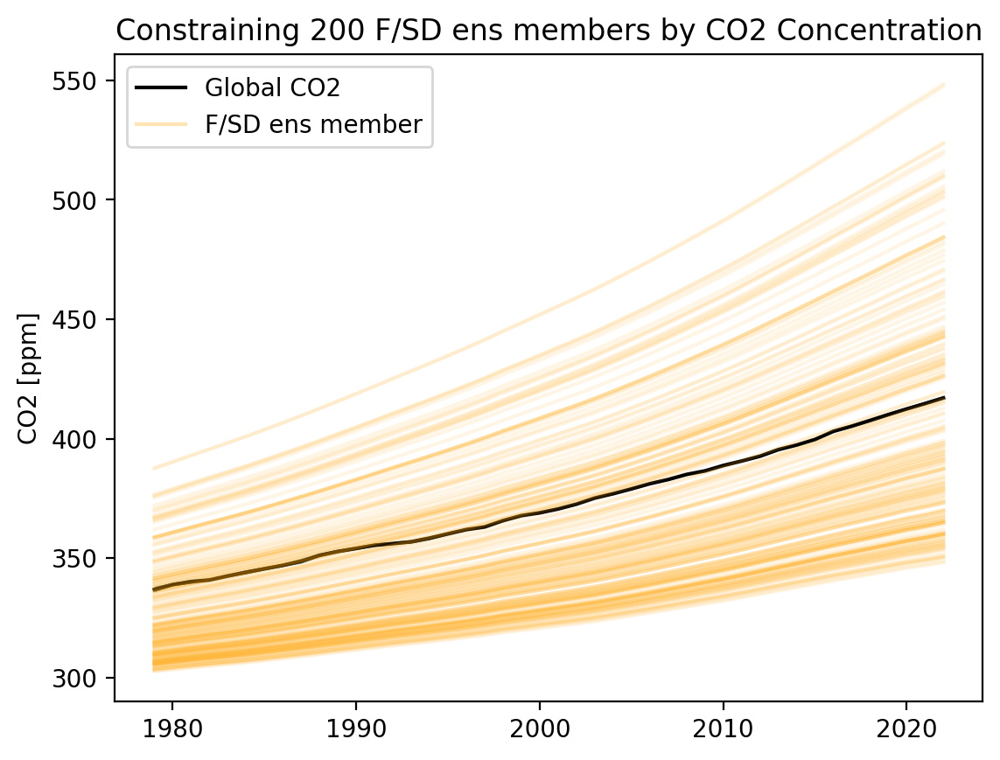

In [375]:
years_GL = gl.time[:-1]
GL_obs = gl[:-1]
constrain = {}
CI = 0.9
blast = 10

plt.figure(dpi = 200)

plt.plot(years_GL,GL_obs, 'k', label = 'Global CO2')
plt.fill_between(years_GL,GL_obs+(blast*gl_unc[:-1]), GL_obs-(blast*gl_unc[:-1]))

constrained_config_ens_GL = []
for i in range(len(config_ens)):
#     param = config_ens[i][4]
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[i])]
    GL_model = C_atm[gl.time[0].values-1850:gl.time[0].values-1850+len(GL_obs)]
    if i == 0:
        plt.plot(years_GL,GL_model, 'orange', alpha = 0.3, label = 'F/SD ens member')
    else:
        plt.plot(years_GL,GL_model, 'orange', alpha = 0.1)
    print(i, hist_temp(Tobs = GR_obs, Tmodel = GR_model, years = years_GR, CI = CI))
    constraint = hist_temp(Tobs = GL_obs, Tmodel = GL_model, years = years_GL)
    if constraint[0]:
        constrained_config_ens_GL.append((int(i), np.sum(np.abs(constraint[1]-constraint[3]))/len(years_GL), ))
        if i == 1: #i'm doing this because I know the 1st is True
            plt.plot(years_GL,GL_model, color = 'blue', alpha = 0.3, label = f'const. F/SD ens member (CI = {CI})')
        else:
            plt.plot(years_GL,GL_model, color = 'blue', alpha = 0.1)
plt.title('Constraining 200 F/SD ens members by CO2 Concentration')
plt.legend(loc='best')
plt.ylabel('CO2 [ppm]')
plt.show()

In [376]:
years_GR

<xarray.DataArray 'time' (time: 64)>
array([1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970,
       1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006,
       2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019, 2020, 2021, 2022])
Coordinates:
  * time     (time) int64 1959 1960 1961 1962 1963 ... 2018 2019 2020 2021 2022

In [377]:
years_GR

<xarray.DataArray 'time' (time: 64)>
array([1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970,
       1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006,
       2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019, 2020, 2021, 2022])
Coordinates:
  * time     (time) int64 1959 1960 1961 1962 1963 ... 2018 2019 2020 2021 2022

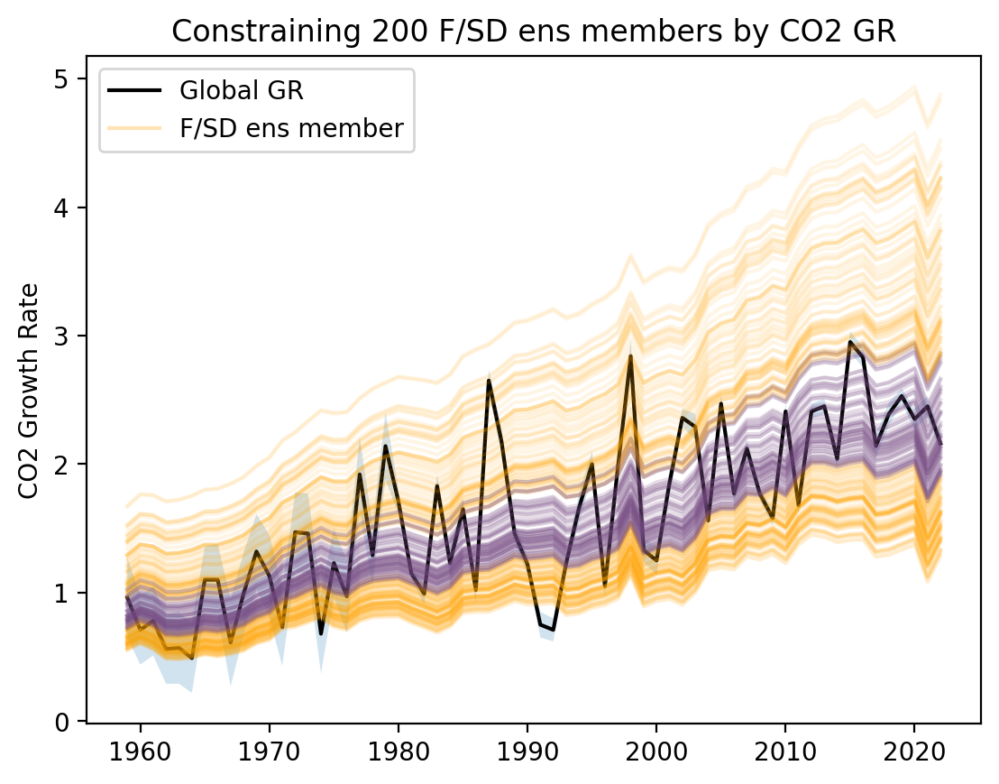

In [373]:
years_GR = gr.time
GR_obs = gr
constrain = {}
CI = 0.68

plt.figure(dpi = 200)

plt.plot(years_GR,GR_obs, 'k', label = 'Global GR')
plt.fill_between(years_GR,GR_obs+gr_unc, GR_obs-gr_unc, alpha = 0.2,)
# plt.fill_between(np.arange(1960, 1960+60,1),GR_obs + 10*0.11, GR_obs - 10*0.11, alpha = 0.1)
constrained_config_ens = []
for i in range(len(config_ens)):
#     param = config_ens[i][4]
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[i])]
    GR_model_long = xr.DataArray(np.diff(C_atm), coords = {'time': (C_atm.timebounds+1850).values[1:]})
    GR_model = GR_model_long.sel(time = slice(1959,2022))
    if i == 0:
        plt.plot(years_GR,GR_model, 'orange', alpha = 0.3, label = 'F/SD ens member')
    else:
        plt.plot(years_GR,GR_model, 'orange', alpha = 0.1)
#     print(i, hist_temp(Tobs = GR_obs, Tmodel = GR_model, years = years_GR, CI = CI))
    constraint = hist_temp(Tobs = GR_obs, Tmodel = GR_model, years = years_GR)
    if constraint[0]:
        constrained_config_ens.append((int(i), np.sum(np.abs(constraint[1]-constraint[3]))/len(years_GR), ))
        if i == 1: #i'm doing this because I know the 1st is True
            plt.plot(years_GR,GR_model, color = 'blue', alpha = 0.3, label = f'const. F/SD ens member (CI = {CI})')
        else:
            plt.plot(years_GR,GR_model, color = 'blue', alpha = 0.1)
plt.title('Constraining 200 F/SD ens members by CO2 GR')
plt.legend(loc='best')
plt.ylabel('CO2 Growth Rate')
plt.show()

In [374]:
dtype = [('iparam', int),('error', float),
#          ('params', list)
        ]
a_ht = np.array(constrained_config_ens, dtype=dtype)       # create a structured array
ordered_ht = np.sort(a=a_ht, order='error')

In [ ]:
plt.figure(dpi = 150, figsize = (12,4))
parameters = ['beta_550(ab)','beta_550(sq)', 'beta_550(ht)',
              'Q10_resp(ab)','Q10_resp(sq)', 'Q10_resp(ht)',
              'kwScalar(ab)','kwScalar(sq)', 'kwScalar(ht)',
              'PsiScalar(ab)','PsiScalar(sq)', 'PsiScalar(ht)',
              'dPsidb(ab)','dPsidb(sq)', 'dPsidb(ht)'
             ]
k = 10
colors = plt.cm.viridis(np.linspace(0,1,k))

# m = 2
m = k
for i in range(m):
    plt.scatter(parameters[0],(f_gcbSD.carbon_configs.gems_beta_550[[ordered_ab[i][0]]] - beta_550_bounds[0])/(beta_550_bounds[1]-beta_550_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[1],(f_gcbSD.carbon_configs.gems_beta_550[[ordered_sq[i][0]]] - beta_550_bounds[0])/(beta_550_bounds[1]-beta_550_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[2],(f_gcbSD.carbon_configs.gems_beta_550[[ordered_ht[i][0]]] - beta_550_bounds[0])/(beta_550_bounds[1]-beta_550_bounds[0]), color = colors[i], alpha = 0.5)
    
    plt.scatter(parameters[3],(f_gcbSD.carbon_configs.gems_Q10_resp[[ordered_ab[i][0]]] - Q10_resp_bounds[0])/(Q10_resp_bounds[1]-Q10_resp_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[4],(f_gcbSD.carbon_configs.gems_Q10_resp[[ordered_sq[i][0]]] - Q10_resp_bounds[0])/(Q10_resp_bounds[1]-Q10_resp_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[5],(f_gcbSD.carbon_configs.gems_Q10_resp[[ordered_ht[i][0]]] - Q10_resp_bounds[0])/(Q10_resp_bounds[1]-Q10_resp_bounds[0]), color = colors[i], alpha = 0.5)
    
    plt.scatter(parameters[6],(f_gcbSD.carbon_configs.gems_kwScalar[[ordered_ab[i][0]]] - kwScalar_bounds[0])/(kwScalar_bounds[1]-kwScalar_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[7],(f_gcbSD.carbon_configs.gems_kwScalar[[ordered_sq[i][0]]] - kwScalar_bounds[0])/(kwScalar_bounds[1]-kwScalar_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[8],(f_gcbSD.carbon_configs.gems_kwScalar[[ordered_ht[i][0]]] - kwScalar_bounds[0])/(kwScalar_bounds[1]-kwScalar_bounds[0]), color = colors[i], alpha = 0.5)
    
    plt.scatter(parameters[9],(f_gcbSD.carbon_configs.gems_PsiScalar[[ordered_ab[i][0]]] - PsiScalar_bounds[0])/(PsiScalar_bounds[1]-PsiScalar_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[10],(f_gcbSD.carbon_configs.gems_PsiScalar[[ordered_sq[i][0]]] - PsiScalar_bounds[0])/(PsiScalar_bounds[1]-PsiScalar_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[11],(f_gcbSD.carbon_configs.gems_PsiScalar[[ordered_ht[i][0]]] - PsiScalar_bounds[0])/(PsiScalar_bounds[1]-PsiScalar_bounds[0]), color = colors[i], alpha = 0.5)
    
    plt.scatter(parameters[12],(f_gcbSD.carbon_configs.gems_dPsidb[[ordered_ab[i][0]]] - dPsidb_bounds[0])/(dPsidb_bounds[1]-dPsidb_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[13],(f_gcbSD.carbon_configs.gems_dPsidb[[ordered_sq[i][0]]] - dPsidb_bounds[0])/(dPsidb_bounds[1]-dPsidb_bounds[0]), color = colors[i], alpha = 0.5)
    plt.scatter(parameters[14],(f_gcbSD.carbon_configs.gems_dPsidb[[ordered_ht[i][0]]] - dPsidb_bounds[0])/(dPsidb_bounds[1]-dPsidb_bounds[0]), color = colors[i], alpha = 0.5)


plt.xticks(range(len(parameters)), parameters)
plt.xticks(rotation=45, ha='right')

plt.title(f'top {m} parameter combinations in coupled F/SD ensemble')
plt.ylabel('normalized scale')


In [ ]:
top_beta_ab = []
top_beta_sq = []
top_beta_ht = []
for i in range(50):
    top_beta_ab.append(config_ens[ordered_ab[i][0]][0])
    top_beta_sq.append(config_ens[ordered_sq[i][0]][0])
    top_beta_ht.append(config_ens[ordered_ht[i][0]][0])
mean_beta_ab = np.mean(top_beta_ab)
# print(beta550_to_betafert(np.mean(top_beta_ab)))
mean_beta_sq = np.mean(top_beta_sq)
# print(beta550_to_betafert(np.mean(top_beta_sq)))
mean_beta_ht = np.mean(top_beta_ht)
# print(beta550_to_betafert(np.mean(top_beta_ht)))

In [ ]:
for i in range(20):
    print(config_ens[ordered_ab[i][0]][0])

In [ ]:
plt.figure(dpi = 200)
for i in range(75):
    if i<10:
        plt.scatter('beta_ab', f_gcbSD.carbon_configs.gems_beta_550[[ordered_ab[i][0]]].values, c = 'm',alpha = 0.5)
    else:
        plt.scatter('beta_ab', f_gcbSD.carbon_configs.gems_beta_550[[ordered_ab[i][0]]].values, c = 'g',alpha = 0.1)
for i in range(75):
    if i<10:
        plt.scatter('beta_sq', f_gcbSD.carbon_configs.gems_beta_550[[ordered_sq[i][0]]].values, c = 'm',alpha = 0.5)
    else:
        plt.scatter('beta_sq', f_gcbSD.carbon_configs.gems_beta_550[[ordered_sq[i][0]]].values, c = 'g',alpha = 0.1)
for i in range(75):
    if i<10:
        plt.scatter('beta_ht', f_gcbSD.carbon_configs.gems_beta_550[[ordered_ht[i][0]]].values, c = 'm',alpha = 0.5)
    else:
        plt.scatter('beta_ht', f_gcbSD.carbon_configs.gems_beta_550[[ordered_ht[i][0]]].values, c = 'g',alpha = 0.1)
plt.ylim([1.0,1.63])
plt.title(f'F/SD top beta values\n mean: ab:{np.round(mean_beta_ab,2)}, sq:{np.round(mean_beta_sq,2)}, ht:{np.round(mean_beta_ht,2)}')

In [ ]:
# ML growth rate has standard deviation of 0.11
# "The estimated uncertainty in the Mauna Loa annual mean growth rate is 0.11 ppm/yr."
# https://gml.noaa.gov/ccgg/trends/gr.html

In [ ]:
GR_obs

In [ ]:
plt.figure(dpi = 200)
plt.plot(np.arange(1959, 1959+63,1),GR_obs, 'k', label = 'ML')
plt.fill_between(np.arange(1959, 1959+63,1),GR_obs + 3*0.11, GR_obs - 3*0.11, alpha = 0.2)
constrained_config_ens = []
for i in range(len(config_ens)):
#     param = config_ens[i][4]
    C_atm = f_gcbSD.concentration.loc[dict(scenario='hist_gcb',specie='CO2',config = f_gcbSD.configs[i])]
    Cmodel = (C_atm)[109:109+64]
    GR_model = np.diff(Cmodel)
    if i == 0:
        plt.plot(np.arange(1959, 1959+63,1),GR_model, 'orange', alpha = 0.3, label = 'F/SD ens member')
    else:
        plt.plot(np.arange(1959, 1959+63,1),GR_model, 'orange', alpha = 0.1)
#     print(i, hist_temp(Tobs = GR_obs, Tmodel = GR_model, years = years_GR))
    constraint = hist_temp(Tobs = GR_obs, Tmodel = GR_model, years = years_GR)
    if constraint[0]:
        constrained_config_ens.append((int(i), np.sum(np.abs(constraint[1]-constraint[3]))/len(years_GR), ))
        if i == 1: #i'm doing this because I know the 0th is True
            plt.plot(np.arange(1959, 1959+63,1),GR_model, color = 'blue', alpha = 0.3, label = 'const. F/SD ens member (CI = 0.9)')
        else:
            plt.plot(np.arange(1959, 1959+63,1),GR_model, color = 'blue', alpha = 0.1)
plt.title('Constraining 200 F/SD ens members by CO2 GR')
plt.legend(loc='best')
plt.ylabel('CO2 Growth Rate')
plt.show()

In [65]:
# use me for regular fair run:

ds = xr.Dataset(
    data_vars=dict(
        temperature=(["time", "scenario", "config"], f.temperature.loc[dict(layer=0)].data),
        co2_concentration=(["time", "scenario", "config"], f.concentration.loc[dict(specie="CO2")].data),
        airborne_fraction=(["time", "scenario", "config"], f.airborne_fraction.loc[dict(specie="CO2")].data),
        co2_partitions=(["time", "scenario", "config","gasbox"], f.co2_partitions.loc[dict(specie="CO2")].data),
        flux=(["time", "scenario", "config","gasbox"], f.flux.loc[dict(specie="CO2")].data),
        ecs=(["config"], f.ebms.ecs.data),
        tcr=(["config"], f.ebms.tcr.data),
        # gems_beta_550=(["config"], f.carbon_configs.gems_beta_550.data),
        # gems_Q10_resp=(["config"], f.carbon_configs.gems_Q10_resp.data),
        # gems_kwScalar=(["config"], f.carbon_configs.gems_kwScalar.data),
        # gems_PsiScalar=(["config"], f.carbon_configs.gems_PsiScalar.data),
        # gems_dPsidb=(["config"], f.carbon_configs.gems_dPsidb.data),
        baseline_concentration=(["config"], f.species_configs.baseline_concentration.loc[dict(specie="CO2")].data),
    ),
    coords=dict(
        time=np.arange(len(f.timebounds)),
        config=list(f.configs),
        scenario=scenarios,
        gasbox=f.gasboxes,
    ),
)

In [160]:
# ds = xr.Dataset(
#     data_vars=dict(
#         temperature=(["time", "scenario", "config"], f.temperature.loc[dict(layer=0)].data),
#         co2_concentration=(["time", "scenario", "config"], f.concentration.loc[dict(specie="CO2")].data),
#         airborne_fraction=(["time", "scenario", "config"], f.airborne_fraction.loc[dict(specie="CO2")].data),
#         co2_partitions=(["time", "scenario", "config","gasbox"], f.co2_partitions.loc[dict(specie="CO2")].data),
#         flux=(["time", "scenario", "config","gasbox"], f.flux.loc[dict(specie="CO2")].data),
#         ecs=(["config"], f.ebms.ecs.data),
#         tcr=(["config"], f.ebms.tcr.data),
#         gems_beta_550=(["config"], f.carbon_configs.gems_beta_550.data),
#         gems_Q10_resp=(["config"], f.carbon_configs.gems_Q10_resp.data),
#         gems_kwScalar=(["config"], f.carbon_configs.gems_kwScalar.data),
#         gems_PsiScalar=(["config"], f.carbon_configs.gems_PsiScalar.data),
#         gems_dPsidb=(["config"], f.carbon_configs.gems_dPsidb.data),
# #         baseline_concentration=(["config"], f_gcbSD.species_configs.baseline_concentration.loc[dict(specie="CO2")].data),
#     ),
#     coords=dict(
#         time=np.arange(len(f.timebounds)),
#         config=list(gems_cal_1_2_0_df.index),
#         scenario=scenarios,
#         gasbox=f.gasboxes,
#     ),
# )

In [66]:
os.makedirs('../output/', exist_ok=True)
ds.to_netcdf('../output/f_nonSD_200ens_all-output_fair2.1.3_cal_1_2_0_df.nc')

In [ ]:
# OK, from here I'm going to select the constrained parameter sets:
# Let's select the parameter sets that are within
# 1. AME < 10 ppm (for global monitoring period)
# 2. Growth rate in CI 0.68 (purple)

In [ ]:
# f_gcbSD.configs

In [ ]:
i_constrained_ab = []
constrained_ccens_ab = []
for i in ordered_ab:
    if i[1]<10:
        i_constrained_ab.append(i[0])
        constrained_ccens_ab.append(f_gcbSD.configs[i[0]])
    else:
        pass
print(constrained_ccens_ab)

In [ ]:
gems_climate_configs_ab = f_gcbSD.climate_configs.sel(config=constrained_ccens_ab)
gems_carbon_configs_ab = f_gcbSD.carbon_configs.sel(config=constrained_ccens_ab)

In [ ]:
gems_carbon_configs_ab

In [ ]:
i_constrained_ht = []
constrained_ccens_ht = []
for i in ordered_ht:
    i_constrained_ht.append(i[0])
    constrained_ccens_ht.append(f_gcbSD.configs[i[0]])
print(constrained_ccens_ht)

In [ ]:
gems_climate_configs_ht = f_gcbSD.climate_configs.sel(config=constrained_ccens_ht)
gems_carbon_configs_ht = f_gcbSD.carbon_configs.sel(config=constrained_ccens_ht)

In [ ]:
a = gems_carbon_configs_ht.config
b = gems_carbon_configs_ab.config

any(np.isin(a,b))

In [ ]:
# Python program to illustrate the intersection
# of two lists in most simple way
def intersection(lst1, lst2):
    lst3 = []
    for value in lst1:
        if value in lst2:
            lst3.append(int(value))
        else:
            pass
    return lst3
 
# Driver Code
lst1 = list(a)
lst2 = list(b)
lst3 = intersection(lst1, lst2)

In [ ]:
# gems_constrained_configs = np.array(lst3)

# # Save the array to a binary file
# import datetime

# file_name = f'gems_constrained_config_ens_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
# np.save(file_name, gems_constrained_configs)

# # Load the saved array
# file_name = f'gems_constrained_config_ens_{datetime.datetime.now().strftime("%H%M_%m%d%Y")}.npy'
# arr_loaded = np.load(file_name)
# print(arr_loaded)

# config_ens = arr_loaded

In [ ]:
f.timebounds

In [ ]:
for i in range(31):
    plt.plot(np.squeeze(f.concentration.sel(specie='CO2')))

In [ ]:
for i in range(31):
    plt.plot(np.squeeze(f.co2_partitions.isel(specie=0)[:,:,:,i]), label = i)
plt.legend()

In [ ]:
for i in range(24):
    plt.plot(np.squeeze(f.co2_partitions[:,:,:,0,i]), label = i);
plt.legend();plt.show();plt.close()

In [ ]:
fig, ax = plt.subplots(2, 2)
# ax[0,0].plot(f.timepoints[:150], f.emissions.loc[dict(specie="CO2", scenario="esm-flat10", timepoints=np.arange(0.5, 150))], color='k', alpha=0.1);
ax[0,0].plot(f.timepoints, f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[0,0].plot(f.timepoints, f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[0,1].plot(np.arange(0, 151), f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[0,1].plot(f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[0,1].plot(f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[1,0].plot(np.arange(0, 151), f.concentration.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[1,0].plot(f.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[1,0].plot(f.concentration.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[1,1].plot(np.arange(0, 151), f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[1,1].plot(f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[1,1].plot(f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');

In [ ]:
for i in range(8,31):
    plt.plot(f.co2_partitions[:,])

In [ ]:
fig, ax = plt.subplots(2, 2)
# ax[0,0].plot(f.timepoints[:150], f.emissions.loc[dict(specie="CO2", scenario="esm-flat10", timepoints=np.arange(0.5, 150))], color='k', alpha=0.1);
ax[0,0].plot(f.timepoints, f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[0,0].plot(f.timepoints, f.emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[0,1].plot(np.arange(0, 151), f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[0,1].plot(f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[0,1].plot(f.cumulative_emissions.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[1,0].plot(np.arange(0, 151), f.concentration.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[1,0].plot(f.concentration.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[1,0].plot(f.concentration.loc[dict(specie="CO2", scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');
# ax[1,1].plot(np.arange(0, 151), f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
ax[1,1].plot(f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec")], color='b', alpha=0.1);
# ax[1,1].plot(f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr")], color='r', alpha=0.1, ls=':');

In [ ]:
plt.plot(np.arange(0, 151), f.airborne_fraction.loc[dict(specie="CO2", scenario="esm-flat10", timebounds=np.arange(0, 151))], color='k', alpha=0.1);
plt.plot(f.airborne_fraction.loc[dict(specie="CO2", scenario="esm-flat10_zec")], color='b', alpha=0.1);
plt.plot(np.arange(0, 291), f.airborne_fraction.loc[dict(specie="CO2", scenario="esm-flat10_cdr", timebounds=np.arange(0, 291))], color='r', alpha=0.1, ls=':');

In [ ]:
df = pd.DataFrame(
    {
        "tcre": tcre,
        "zec50": zec50,
        "zec100": zec100,
        "zec200": zec200,
        "tr1000": tr1000,
        "tr0": tr0,
        "tpw": tpw,
    },
    index = f.configs
)

In [ ]:
# TCRE is just warming at year 100
tcre = f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=100)]

# ZEC50 is just warming at year 150 minus year 100
zec50 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=150)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=100)]
)

# ZEC100 is just warming at year 200 minus year 100
zec100 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=200)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=100)]
)

# ZEC200 is just warming at year 300 minus year 100
zec200 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=300)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_zec", timebounds=100)]
)

# # TNZ can be calculated as a 20 year average around year 150 in esm-flat10-cdr minus a 20 year average around year 125 in esm-flat10
# tnz = (
#     f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr", timebounds=150)] - 
#     f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=125)]
# )

# TR1000 can be calculated as a 20 year average around year 200 in esm-flat10-cdr minus a 20 year average around year 100 in esm-flat10
tr1000 = (
    f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr", timebounds=200)] - 
    f.temperature.loc[dict(layer=0, scenario="esm-flat10", timebounds=100)]
)

# TR0 can be calculated as a 20 year average around year 310 in esm-flat10-cdr
tr0 = f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr", timebounds=310)]

# Time to Peak Warming (tPW) can be calculated as the time difference between the peak value of 20-year smoothed global mean 
# temperatures and the point that net zero is achieved in esm-flat10-cdr (year 150)
tpw = f.temperature.loc[dict(layer=0, scenario="esm-flat10_cdr")].argmax(axis=0) - 150

In [ ]:
sns.pairplot(
    df,
    corner=True,
    plot_kws={"alpha": 0.5},
    height=1,
)

In [ ]:
os.makedirs('../output/', exist_ok=True)
df.to_csv('../output/flat10_key-metrics_fair2.1.2_cal1.2.0.csv')

In [ ]:
ds = xr.Dataset(
    data_vars=dict(
        temperature=(["time", "scenario", "config"], f.temperature.loc[dict(layer=0)].data),
        co2_concentration=(["time", "scenario", "config"], f.concentration.loc[dict(specie="CO2")].data),
        airborne_fraction=(["time", "scenario", "config"], f.airborne_fraction.loc[dict(specie="CO2")].data),
        ecs=(["config"], f.ebms.ecs.data),
        tcr=(["config"], f.ebms.tcr.data),
        tcre=(["config"], tcre.data),
        zec50=(["config"], zec50.data),
        zec100=(["config"], zec100.data),
        zec200=(["config"], zec200.data),
        tr1000=(["config"], tr1000.data),
        tr0=(["config"], tr0.data),
        tpw=(["config"], tpw.data),
    ),
    coords=dict(
        time=np.arange(321),
        config=list(cal_1_2_0_df.index),
        scenario=scenarios
    ),
)

In [ ]:
plt.plot(f.temperature.isel(scenario = 1).isel(config=1).isel(layer=0))
plt.plot(f.temperature.isel(scenario = 1).isel(config=1).isel(layer=1))
plt.plot(f.temperature.isel(scenario = 1).isel(config=1).isel(layer=2))

In [ ]:
# ds.to_netcdf('../output/flat10_all-output_fair2.1.2_cal1.2.0.nc')